In [1]:
#
import numpy as np
import os, sys

#
sys.path.insert(0, '/global/homes/q/qmxp55/DESI/bgstargets/py')

from io_ import get_sweep_whole, getBGSbits, flux_to_mag, cut
from io_ import get_random, get_isdesi, get_dict, bgsmask, get_reg, get_svfields, get_svfields_fg, get_svfields_ij, get_svfields_k, gaiaAEN
from cuts import getGeoCuts, bgsbut
from QA import getStats, flow, mollweide, mycmap, plot_sysdens, overdensity, hexbin, plot_venn2
from postages_images import postages_circle

import healpy as hp
import astropy.io.fits as fits
import fitsio
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib

from astropy.coordinates import SkyCoord
import astropy.units as units
from astropy.table import Table, Column

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

#
sys.path.insert(0, '/global/homes/q/qmxp55/DESI/ls_postages')
from main import html_postages

import bokeh.plotting as bk
from bokeh.models import Tabs
from bokeh.io import show


# set up

In [3]:
#
dr = 'dr9m'
survey = 'north' #is either south (DECaLS+DES) or north (BASS/MzLS)
version = '0.1.0'
filesdir = '/global/cscratch1/sd/qmxp55/bgstargets_output/'
Nranfiles = 3
#reg = 'svfields_k'
#reg = 'svfields_ij'
#reg = 'svfields'
reg = 'north'
dec_resol_ns = 32.375
if (dr[:3] == 'dr9') & (dr[:4] != 'dr9m'): Nranfiles = 20 # because the randoms for dr9d have a density of 100000 = 5000*20

pathdir = os.path.abspath(os.getcwd())+'/%s-%s_%s_%s_draft_plots' %(dr, survey, reg, version)
ispathdir = os.path.isdir(pathdir)
if not ispathdir: os.mkdir(pathdir)
    
if reg[:8] == 'svfields': desifootprint = False
else: desifootprint = True
    
#Density of randoms
if dr[:4] == 'dr9m': ranfiledens = 1000
else: ranfiledens = 5000

# for healpy
dr8pix     = '/project/projectdirs/desi/target/catalogs/dr8/0.31.1/pixweight/pixweight-dr8-0.31.1.fits'
dr9mpix = '/global/cfs/cdirs/desi/target/catalogs/dr9m/0.42.0/pixweight/main/resolve/bright/pixweight-bright.fits'

if dr[:3] == 'dr8': pixfile = dr8pix
elif dr[:3] == 'dr9': pixfile = dr9mpix
    
hdr          = fits.getheader(pixfile,1)
nside,nest   = hdr['hpxnside'],hdr['hpxnest']
npix         = hp.nside2npix(nside)
pixarea      = hp.nside2pixarea(nside,degrees=True)

In [ ]:
#load catalogues
if (dr[:3] == 'dr9') & (dr[:4] != 'dr9m'): N = 1
else: N = Nranfiles
    
#%time cat = np.load(filesdir+dr+'/'+version+'/'+'bgstargets-'+survey+'.npy', mmap_mode='r+')
%time cat = np.load(filesdir+dr+'/'+version+'/'+'bgstargets-'+survey+'.npy')
%time cat_ex = np.load(filesdir+dr+'/'+version+'/'+'extra-'+survey+'_n256.npy')


In [ ]:

%time ran = np.load(filesdir+dr+'/'+dr+'_random_N'+str(N)+'.npy')
%time ran_ex = np.load(filesdir+dr+'/'+'extra_random_N'+str(N)+'_n256.npy')

In [ ]:
hppix_ran = ran_ex['hppix']
ranindesi = ran_ex['desi']

hppix_cat = cat_ex['hppix']
catindesi = cat_ex['desi']

if (reg == 'svfields_ij'):
    
    print('dr9{i/j} fields footprint selected')
    
    raninreg = get_svfields_ij(ran['RA'], ran['DEC'], survey=survey)
    catinreg = get_svfields_ij(cat['RA'], cat['DEC'], survey=survey)
    
elif (reg == 'svfields_k'):
    
    print('dr9k fields footprint selected')
    
    raninreg = get_svfields_k(ran['RA'], ran['DEC'], survey=survey)
    catinreg = get_svfields_k(cat['RA'], cat['DEC'], survey=survey)
    
else:

    #if svfields don't use desifootprint
    #tunning in south as dr9f/dr9g does not entirely cover southern ages region
    if (reg == 'svfields_fg') & (survey == 'south'): tun, tun_ran = (cat['DEC'] < 30), (ran['DEC'] < 30)
    else: tun, tun_ran = np.ones_like(cat['RA'], dtype=bool), np.ones_like(ran['RA'], dtype=bool)
    #tunning in north as dr9f/dr9g does not entirely cover highstardens_n region
    if (reg == 'svfields_fg') & (survey == 'north'): tun2, tun2_ran = (cat['RA'] < 280), (ran['RA'] < 280)
    else: tun2, tun2_ran = np.ones_like(cat['RA'], dtype=bool), np.ones_like(ran['RA'], dtype=bool)

    if not desifootprint: raninreg = (ran_ex[reg]) & (ran_ex[survey]) & (tun_ran) & (tun2_ran)
    else: raninreg = (ran_ex[reg]) & (ran_ex['desi']) & (ran_ex[survey]) & (tun_ran) & (tun2_ran)

    #if svfields don't use desifootprint
    if not desifootprint: catinreg = (cat_ex[reg]) & (cat_ex[survey]) & (tun) & (tun2)
    else: catinreg = (cat_ex[reg]) & (cat_ex['desi']) & (cat_ex[survey]) & (tun) & (tun2)


## Filter catalogue and randoms by region

In [ ]:
#RANDOMS
ran = ran[raninreg]
ran_ex = ran_ex[raninreg]
ranindesi = ranindesi[raninreg]
hppix_ran = hppix_ran[raninreg]
raninreg = raninreg[raninreg]

#CATALOGUE
cat = cat[catinreg]
cat_ex = cat_ex[catinreg]
catindesi = catindesi[catinreg]
hppix_cat = hppix_cat[catinreg]
catinreg = catinreg[catinreg]


In [ ]:
#bgsmask = bgsmask()
rancuts = getGeoCuts(ran, randoms=True)

In [ ]:
#
#Make sure fotprints in catalogue and randoms are the same
if False:
    
    plt.figure(figsize=(20, 15))

    plt.subplot(2,1,1)
    plt.scatter(cat['RA'][::10], cat['DEC'][::10], s=1, c='k')
    plt.grid()
    plt.subplot(2,1,2)
    plt.scatter(ran['RA'][::100], ran['DEC'][::100], s=1, c='k')
    plt.grid()

## Get area without randoms

In [10]:
#Notes: This hpdict is used to get the area only using the randoms. 
#This use the randoms within the DESI footprint and without any masking (maskrand=None) as we want the area without wholes.
hpdict0 = get_dict(cat=None, pixmapfile=pixfile, hppix_ran=hppix_ran, hppix_cat=None, 
                      maskrand=None, maskcat=None, Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                            desifootprint=desifootprint, namesels=None, target_outputs=False, log=True, ranfiledens=ranfiledens)

positions and desifotprint DONE...
systematics DONE...
randdens =  3000  ; len randoms =  13563528
bgsfracarea DONE...
regions DONE...
area_all = 4521 deg2
bgsarea_south = 0 deg2
bgsarea_decals = 0 deg2
bgsarea_des = 0 deg2
bgsarea_north = 4521 deg2
bgsarea_south_n = 0 deg2
bgsarea_south_s = 0 deg2
bgsarea_svfields = 200 deg2
bgsarea_svfields_n = 200 deg2
bgsarea_svfields_s = 0 deg2
bgsarea_svfields_fg = 95 deg2
bgsarea_svfields_fg_n = 95 deg2
bgsarea_svfields_fg_s = 0 deg2
bgsarea_svfields_ij = 55 deg2
bgsarea_svfields_ij_n = 55 deg2
bgsarea_svfields_ij_s = 0 deg2
bgsarea_svfields_k = 118 deg2
bgsarea_svfields_k_n = 118 deg2
bgsarea_svfields_k_s = 0 deg2
areas DONE...


## Get reduced area with randoms

In [11]:
#dic with default BGS selection and in DESI footprint
#Appy or not apply LG mask in randoms (rancuts['LG'])?
hpdict = get_dict(cat=cat, pixmapfile=pixfile, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=desifootprint, namesels={'bgs_any':20, 'bright':21, 'faint':22}, 
                                  galb=cat_ex['b'], log=True, survey='bgs', ranfiledens=ranfiledens)

positions and desifotprint DONE...
systematics DONE...
randdens =  3000  ; len randoms =  13563528
bgsfracarea DONE...
regions DONE...
area_all = 4468 deg2
bgsarea_south = 0 deg2
bgsarea_decals = 0 deg2
bgsarea_des = 0 deg2
bgsarea_north = 4468 deg2
bgsarea_south_n = 0 deg2
bgsarea_south_s = 0 deg2
bgsarea_svfields = 197 deg2
bgsarea_svfields_n = 197 deg2
bgsarea_svfields_s = 0 deg2
bgsarea_svfields_fg = 94 deg2
bgsarea_svfields_fg_n = 94 deg2
bgsarea_svfields_fg_s = 0 deg2
bgsarea_svfields_ij = 54 deg2
bgsarea_svfields_ij_n = 54 deg2
bgsarea_svfields_ij_s = 0 deg2
bgsarea_svfields_k = 117 deg2
bgsarea_svfields_k_n = 117 deg2
bgsarea_svfields_k_s = 0 deg2
areas DONE...
computing for  north / bgs_any
computing for  north / bright
computing for  north / faint
target densities in north DONE...
computing for  south / bgs_any
computing for  south / bright
computing for  south / faint
target densities in south DONE...
meandens_bgs_any_all = 1372 /deg2
meandens_bgs_any_south = nan /deg2
meand

## BGS outline

In [12]:
#
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)
bgs_b = ((cat['BGSBITS'] & 2**(21)) != 0)
bgs_f = ((cat['BGSBITS'] & 2**(22)) != 0)

print('mean density of BGS: \t %.2f' %(hpdict['meandens_bgs_any_'+survey]))
#print('total density of BGS: \t %.2f' %(hpdict['dens_bgs_any_'+survey]))
print('Area within BGS: \t %.2f' %(hpdict['bgsarea_'+survey]))

print('No BGS galaxies in Bright and Faint: \t %i \t %i \t %i' %(
    np.sum(bgs_b),
    np.sum(bgs_f),
    np.sum(bgs_any)
))


print('Overall density of BGS: \t %d \t %d \t %d' %(
    np.round(hpdict['dens_bright_'+survey], 0),
    np.round(hpdict['dens_faint_'+survey], 0),
    np.round(hpdict['dens_bgs_any_'+survey], 0)
))

print('morph \t BRIGHT \t FAINT \t OVERALL')
print('------------------------------------')
for morph in list(set(cat['TYPE'][:10000])):
    
    keep = cat['TYPE'] == morph
    print('%s \t %d \t %d \t %d' %(
        morph, 
        np.round(np.sum((keep) & (bgs_b))/hpdict['bgsarea_'+survey], 0),
        np.round(np.sum((keep) & (bgs_f))/hpdict['bgsarea_'+survey], 0),
        np.round(np.sum((keep) & (bgs_any))/hpdict['bgsarea_'+survey], 0),
        ))


mean density of BGS: 	 1371.85
Area within BGS: 	 4468.26
No BGS galaxies in Bright and Faint: 	 3578399 	 2510552 	 6088951
Overall density of BGS: 	 801 	 562 	 1363
morph 	 BRIGHT 	 FAINT 	 OVERALL
------------------------------------
REX 	 112 	 151 	 262
DEV 	 132 	 132 	 264
EXP 	 71 	 114 	 185
PSF 	 2 	 1 	 3
SER 	 484 	 165 	 649


In [13]:
if dr[:3] == 'dr9': 
    morphos = ['REX', 'EXP', 'DEV', 'SER']
    PSF = ['PSF']
else: 
    morphos = ['REX ', 'EXP ', 'DEV ', 'COMP']
    PSF = ['PSF ']

## number counts

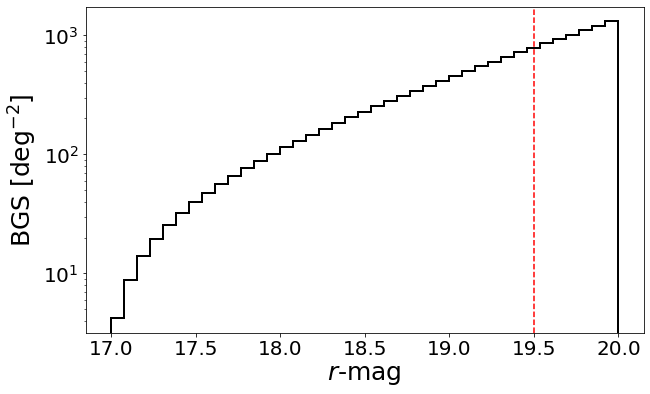

In [14]:
#
area = hpdict0['bgsarea_'+survey]
fig = plt.figure(figsize=(10,6))

rbins = np.linspace(17, 20, 40)
plt.hist(cat['RMAG'][bgs_any], bins=rbins, histtype='step', lw=2, color='k', cumulative=True, weights=np.full(np.sum(bgs_any), 1/area))

plt.axvline(19.5, ls='--', c='r')
#plt.axhline(800, ls='--', c='r')

plt.xlabel(r'$r$-mag', size=25)
plt.ylabel(r'BGS [deg$^{-2}$]', size=25)
#plt.legend(fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.yscale('log')

plt.show()

file = '%s/number_counts' %(pathdir)
fig.savefig(file+'.png', bbox_inches = 'tight', pad_inches = 0, dpi=300)


## BGS dens. sky maps

In [10]:
from QA import mollweide, mycmap, plot_sysdens
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib

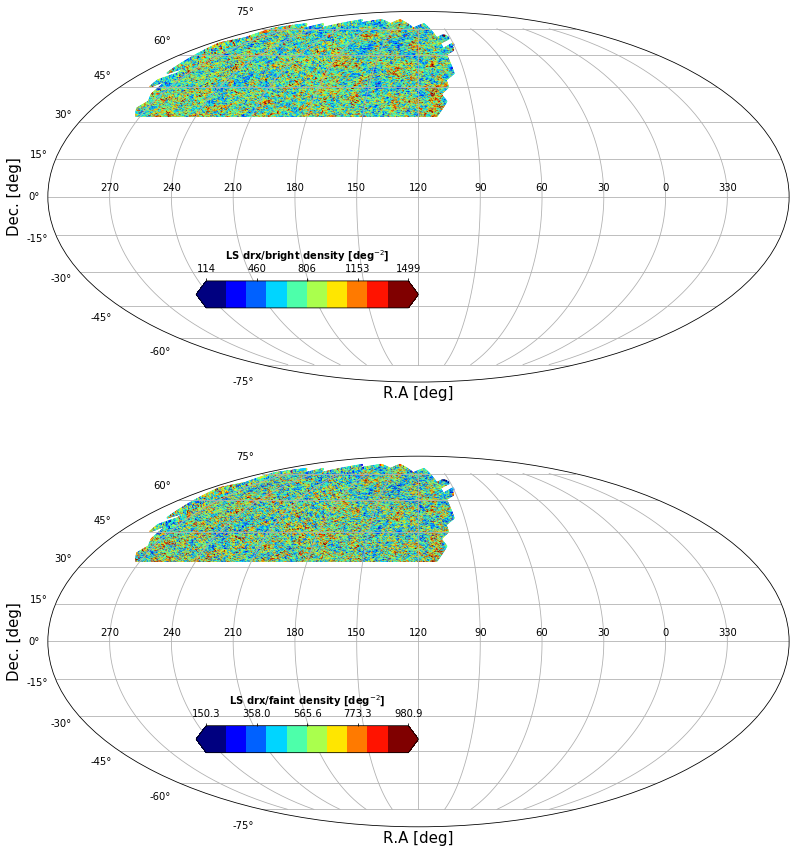

In [16]:
#
if reg[:8] == 'svfields': reg_ = reg+'_'+survey[0]
else: reg_ = reg
    
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(2,1)
    
org          = 120  # centre ra for mollweide plots
projection   = 'mollweide'
cm = mycmap(matplotlib.cm.jet, 10,0,1)
cmr= mycmap(matplotlib.cm.jet_r,10,0,1)

mollweide(hpdict=hpdict, namesel='bright', reg=reg_, projection=projection, n=0, org=org, cm=cm, fig=fig, gs=gs, cval=None, desifootprint=desifootprint)
mollweide(hpdict=hpdict, namesel='faint', reg=reg_, projection=projection, n=1, org=org, cm=cm, fig=fig, gs=gs, cval=None, desifootprint=desifootprint)
#mollweide(hpdict=hpdict, C=None ,namesel='any', reg='all', projection=projection, n=1, org=org, cm=cm, 
#          fig=fig, ws=ws, perc=(0.3,99.8), title='After linear weights', cval=(84, 2750))

file = '%s/skydens_%s_%s' %(pathdir, dr, reg)
fig.savefig(file+'.png', bbox_inches = 'tight', pad_inches = 0, dpi=300)


# Summary of DR8/DR9 changes (Tractor level)

- see slides with changes accross test regions in dr9, mainly BGS: https://docs.google.com/presentation/d/1j4GiU6G2Ctv1dEnbb4Dr4mIxAm7GJm3azi-HnCRj0kU/edit?usp=sharing
- Main changes documented by Imaging team here: http://faraday.uwyo.edu/~admyers/scratch/legacysurvey/output/dr9/updates/ 

# Relaxing BGS TS 

## Allmask overlap with FRACS*

`Allmask` has the particularity to be in the RANDOMS while `FRACS*` does not. Look at their agreements and differences with postage images after applying all the other BGS cuts. Do we want to replace `FRACS*` with `Allmask`? 

- Venn diagrams
- postage images of agreements and disagreements

In [11]:
#
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)

fracs = np.ones_like(cat, dtype=bool)
bgsbutfracs = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM', 'QC_FI', 'QC_FF'], bgsmask=bgsmask(), rlimit=20)
for i in (11,12,13): 
    fracs &= ((cat['BGSBITS'] & 2**(i)) != 0)

#BGS rejected by fracs
bgs_fracs = (bgsbutfracs) & (~fracs)
#BGS rejected by allmask
bgs_allmask = (bgsbutfracs) & (~((cat['BGSBITS'] & 2**(4)) != 0))

print(np.sum(bgs_any), np.sum(bgsbutfracs & fracs))
print(np.sum(bgs_fracs), np.sum(bgs_allmask))


240027 240027
3130 515


Reduced Area within BGS: 	 170.22
Area within BGS: 	 175.72


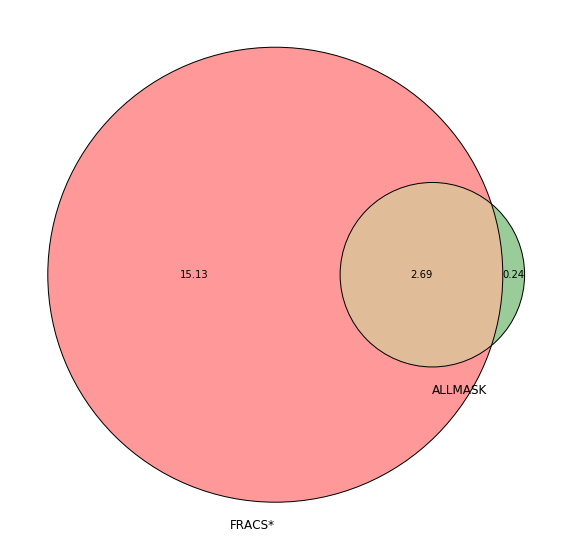

In [12]:
#
print('Reduced Area within BGS: \t %.2f' %(hpdict['bgsarea_'+survey]))
print('Area within BGS: \t %.2f' %(hpdict0['bgsarea_'+survey]))  

area=hpdict0['bgsarea_'+survey]

plot_venn2(A=bgs_fracs, B=bgs_allmask, area=area, title=None, labels=('FRACS*', 'ALLMASK'), savefile='%s/%s' %(pathdir, 'venn2_fracs_vs_allmask'))

## Allmask overlap with relaxed version of FRACS*

This is same test as above but using the relaxed version of `Fracs*` (pass 2 out of 3).

- Venn diagrams
- postage images of agreements and disagreements

In [13]:
#
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)

fracs_re = np.ones_like(cat, dtype=bool)
for i in (14,15,16): 
    fracs_re &= ((cat['BGSBITS'] & 2**(i)) != 0)

#BGS rejected by fracs
bgs_fracs_re = (bgsbutfracs) & (~fracs_re)

print('BGS objects rejected by fracs: \t %.3f /sq.deg' %(np.sum(bgs_fracs)/area))
print('BGS objects rejected by fracs relaxed: \t %.3f /sq.deg' %(np.sum(bgs_fracs_re)/area))
print('BGS objects rejected by allmask : \t %.3f /sq.deg' %(np.sum(bgs_allmask)/area))


BGS objects rejected by fracs: 	 17.812 /sq.deg
BGS objects rejected by fracs relaxed: 	 7.700 /sq.deg
BGS objects rejected by allmask : 	 2.931 /sq.deg


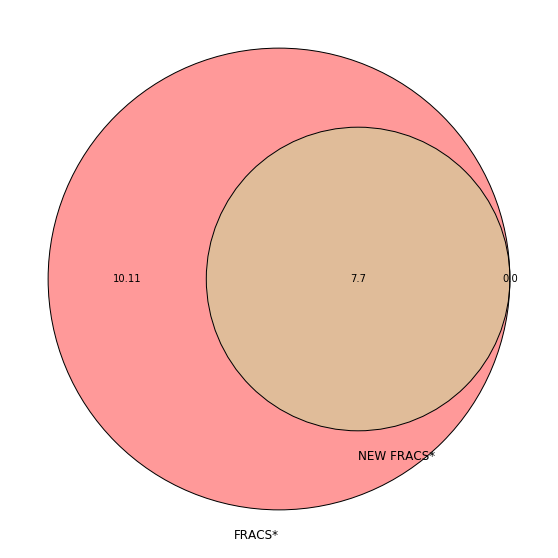

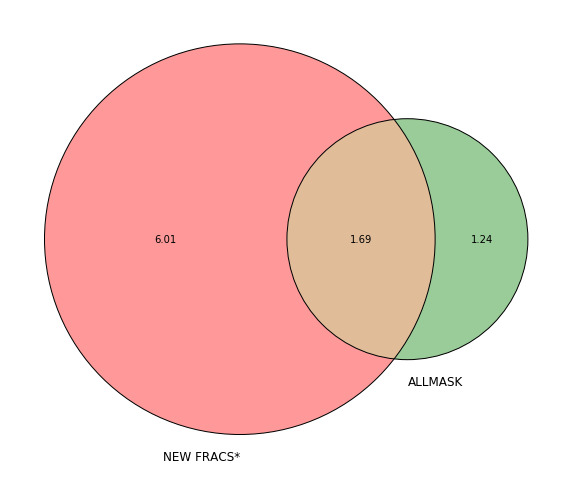

In [14]:
#

plot_venn2(A=bgs_fracs, B=bgs_fracs_re, area=area, title=None, labels=('FRACS*', 'NEW FRACS*'), savefile='%s/%s' %(pathdir, 'venn2_comparison_fracs'))

plot_venn2(A=bgs_fracs_re, B=bgs_allmask, area=area, title=None, labels=('NEW FRACS*', 'ALLMASK'), savefile='%s/%s' %(pathdir, 'venn2_fracs_re_vs_allmask'))


## Gallery: FRACS* & NEW FRACS

    1) NEW FRACS*
    2) FRACS* not in NEW FRACS*
    3) ALLMASK not in NEW FRACS*


In [15]:
rmaglim = (cat['RMAG'] < 19) & (cat['RMAG'] > 18)
galls = {'NEW FRACS*':(bgs_fracs_re) & (rmaglim), 'FRACS* not in NEW FRACS*':(bgs_fracs) & (~bgs_fracs_re) & (rmaglim), 'ALLMASK not in NEW FRACS*':(bgs_allmask) & (~bgs_fracs_re) & (rmaglim)}

for key, val in zip(galls.keys(), galls.values()):
    print(np.sum(val))

323
363
41


In [16]:
#
veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}
info_list = ['RA', 'DEC', 'RMAG', 'GMAG', 'ZMAG', 'TYPE', 'REF_CAT']
info = {key:cat[key] for key in info_list}
layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]
coord = [cat['RA'], cat['DEC']]
grid = [8,5]

tabs = []
galls = {'NEW FRACS*':(bgs_fracs_re), 'FRACS* not in NEW FRACS*':(bgs_fracs) & (~bgs_fracs_re), 'ALLMASK not in NEW FRACS*':(bgs_allmask) & (~bgs_fracs_re)}
rmaglims = {'r < 18':(cat['RMAG'] < 18), '18 < r < 19':(cat['RMAG'] < 19) & (cat['RMAG'] > 18), '19 < r < 20':(cat['RMAG'] < 20) & (cat['RMAG'] > 19)}

for key, val in zip(galls.keys(), galls.values()):
    
    for key2, val2 in zip(rmaglims.keys(), rmaglims.values()):
    
        print('%s (%s): \t %.3f, \t %.3f' %(key, key2, np.sum((val) & (val2))/area, np.sum((val) & (val2))))

        idx = list(np.where((val) & (val2)))[0]
        title = 'BGS rejected by %s at %s' %(key, key2)
        buttons_text = 'select which images and object \n markers you want to display'
        tab_title = '%s (%s)' %(key, key2)

    #
        tab = html_postages(coord=coord, idx=idx, veto=veto, info=info, grid=grid, layer_list=layer_list, title=title, 
                  buttons_text=buttons_text, tab=True, tab_title=tab_title)


        tabs.append(tab)


NEW FRACS* (r < 18): 	 1.747, 	 307.000


Loading BokehJS ...

32.0 122
NEW FRACS* (18 < r < 19): 	 1.838, 	 323.000


Loading BokehJS ...

32.0 122
NEW FRACS* (19 < r < 20): 	 4.114, 	 723.000


Loading BokehJS ...

32.0 122
FRACS* not in NEW FRACS* (r < 18): 	 1.184, 	 208.000


Loading BokehJS ...

32.0 122
FRACS* not in NEW FRACS* (18 < r < 19): 	 2.066, 	 363.000


Loading BokehJS ...

32.0 122
FRACS* not in NEW FRACS* (19 < r < 20): 	 6.863, 	 1206.000


Loading BokehJS ...

32.0 122
ALLMASK not in NEW FRACS* (r < 18): 	 0.256, 	 45.000


Loading BokehJS ...

32.0 122
ALLMASK not in NEW FRACS* (18 < r < 19): 	 0.233, 	 41.000


Loading BokehJS ...

32.0 122
ALLMASK not in NEW FRACS* (19 < r < 20): 	 0.751, 	 132.000


Loading BokehJS ...

32.0 122


In [17]:
#
savefile = '%s/%s' %(pathdir, 'NEW_FRACS_FRACS_and_ALLMASK_differences')

bk.output_notebook()
if savefile is not None:
    html_page = savefile + '.html'
    bk.output_file(html_page, title=savefile)
    print(html_page)

# Put all the tabs into one application
page = Tabs(tabs=tabs)

# Put the tabs in the current document for display
show(page)

Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_svfields_k_0.1.0_draft_plots/NEW_FRACS_FRACS_and_ALLMASK_differences.html


## GAMA completeness

To assess above test, run GAMA completeness for:

1) Nominal BGS

2) Using `allmask` instead of `fracs*`

3) Using relaxed version of `fracs*`

Which one has the better completeness?

In [18]:
#load GAMA DR4

gama_ = fitsio.read('/global/cscratch1/sd/qmxp55/TilingCatv46.fits', ext=1)
# get only good quality gama objects
gama = gama_[(gama_['SURVEY_CLASS'] >= 4) & (gama_['NQ'] >= 3)]
print('fraction of gama good quality: %i / %i' %(len(gama), len(gama_)))

#get rid of stars in GAMA
Ngama = len(gama)
print('Percentage of Galaxies in GAMA Main Sample (z > 0.002): %.2f %%' %(100 * np.sum(gama['Z'] > 0.002)/Ngama))
print('Percentage of Stars in GAMA Main Sample (z < 0.002): %.2f %%' %(100 * np.sum(gama['Z'] < 0.002)/Ngama))

#
gama0 = gama #Include stars and galaxies in GAMA
gama = gama0[gama0['Z'] > 0.002] #Include only galaxies in GAMA

fraction of gama good quality: 186137 / 221373
Percentage of Galaxies in GAMA Main Sample (z > 0.002): 98.07 %
Percentage of Stars in GAMA Main Sample (z < 0.002): 1.93 %


In [28]:
#
def gama12():
    
    return [174., 186., -3., 2.]

def gama15():
    
    return [211.5, 223.5, -2., 3.]

def gama09():
    
    return [129., 141., -2., 3.]

    
#get sweeps for GAMA footprint
lsing15 =  get_sweep_whole(patch=gama15(), dr=dr+'-'+survey, rlimit=None, maskbitsource=False, bgsbits=True, opt='1')


	 fraction: 1421419/1421419 objects
	 fraction: 2070945/2070945 objects
	 fraction: 620560/620560 objects
	 fraction: 831413/831413 objects
	 Sample # objects: 4944337
---- BGSMASK key: ---- 
	 BS, 0, 1
	 MS, 1, 2
	 GC, 2, 4
	 LG, 3, 8
	 allmask, 4, 16
	 nobs, 5, 32
	 SG, 6, 64
	 SGSV, 7, 128
	 FMC, 8, 256
	 FMC2, 9, 512
	 CC, 10, 1024
	 QC_FM, 11, 2048
	 QC_FI, 12, 4096
	 QC_FF, 13, 8192
	 QC_FM2, 14, 16384
	 QC_FI2, 15, 32768
	 QC_FF2, 16, 65536
	 QC_IVAR, 17, 131072
	 bgs_any, 20, 1048576
	 bgs_bright, 21, 2097152
	 bgs_faint, 22, 4194304
	 bgs_sv_any, 30, 1073741824
	 bgs_sv_bright, 31, 2147483648
	 bgs_sv_faint, 32, 4294967296
	 bgs_sv_faint_ext, 33, 8589934592
	 bgs_sv_fibmag, 34, 17179869184
	 bgs_sv_lowq, 35, 34359738368
---- Sanity Check ---- 
	 BS, 4840705, 4840705
	 MS, 4767024, 4767024
	 GC, 4944337, 4944337
	 LG, 4941178, 4941178
	 allmask, 4921628, 4921628
	 nobs, 4940768, 4940768
	 SG, 4651266, 4651266
	 SGSV, 4651921, 4651921
	 FMC, 4921643, 4921643
	 FMC2, 4922412, 492

In [29]:
from io_ import match_gama, gama_assess
ls_gama, gama_ls, ls_z = match_gama(cat=lsing15, gama=gama)


Doubly matched objects = 0
Final matched objects = 61160


In [30]:
#

def gama_assess_plot(pop=['QC_FM', 'QC_FI', 'QC_FF'], savefile=None):
    
    gamagal = (ls_z > 0.002)


    bgsbutfracs = bgsbut(bgsbits=lsing15['BGSBITS'], rmag=lsing15['RMAG'], pop=pop, bgsmask=bgsmask(), rlimit=20)
    fracs_re = np.ones_like(lsing15, dtype=bool)
    for i in (14,15,16): 
        fracs_re &= ((lsing15['BGSBITS'] & 2**(i)) != 0)

    #BGS with fracs relaxed
    bgs_re = (bgsbutfracs) & (fracs_re)

    #BGS with allmask
    bgs_allmask = (bgsbutfracs) & (((lsing15['BGSBITS'] & 2**(4)) != 0))

    #nominal BGS
    bgs = ((lsing15['BGSBITS'] & 2**(20)) != 0)

    dictBGS = {'BGS nominal':bgs, 'BGS FRACS* relaxed':bgs_re, 'BGS with allmask':bgs_allmask}

    #
    fig = plt.figure(figsize=(30, 12))

    print('GAMA & LS %s: %.2f /deg^2'%(dr, np.sum(ls_gama)/60))

    for num, key, val in zip([1,2,3], dictBGS.keys(), dictBGS.values()):

        print('\t %s: \t %.3f /deg^2, \& in GAMA: \t %.3f /deg^2' % (key, np.sum(val)/60, np.sum(val & ls_gama)/60))

        rmagl, Ncomp, Ncont, Nincomp, Ngama_ls, Ntot = gama_assess(cat=lsing15, rmaglab='RMAG', match=ls_gama, gamagal=gamagal, mask=val, cumu=False)
        rmagl_c, Ncomp_c, Ncont_c, Nincomp_c, Ngama_ls_c, Ntot_c = gama_assess(cat=lsing15, rmaglab='RMAG', match=ls_gama, gamagal=gamagal, mask=val, cumu=True)



        plt.subplot(2, 3, num)
        plt.title(r' %s completeness' %(key), size=18)
        plt.plot(rmagl, Ncomp/Ngama_ls, c='k', ls='-', label='bins')
        plt.plot(rmagl_c, Ncomp_c/Ngama_ls_c, c='r', ls='-', label='cumu')
        plt.axvspan(19.2, 20.2, alpha=0.3, color='red')
        plt.axhline(1, ls='--', c='k')
        plt.axvline(19.2, ls=':', label='19.2', color='k')
        plt.xlabel(r'$r_{mag}$', size=18)
        plt.ylabel(r'$f$=(BGS & gama_gal)/gama_gal', size=14)
        plt.ylim(0.8, 1.05)
        plt.legend()
        plt.grid()


        plt.subplot(2, 3, num+3)
        plt.title(r'%s contamination' %(key), size=18)
        plt.plot(rmagl, Ncont/Ngama_ls, c='k', ls='-', label='bins')
        plt.plot(rmagl_c, Ncont_c/Ngama_ls_c, c='r', ls='-', label='cumu')
        plt.axvspan(19.2, 20.2, alpha=0.3, color='red')
        plt.axhline(1, ls='--', c='k')
        plt.axvline(19.2, ls=':', label='19.2', color='k')
        plt.xlabel(r'$r_{mag}$', size=18)
        plt.ylabel(r'$f$=(BGS & ~gama_gal)/gama_gal', size=14)
        plt.ylim(0, 2)
        plt.legend()
        plt.grid()

    if savefile is not None:
        fig.savefig(savefile+'.png', bbox_inches = 'tight', pad_inches = 0)


GAMA & LS dr8: 1019.33 /deg^2
	 BGS nominal: 	 1422.400 /deg^2, \& in GAMA: 	 980.050 /deg^2
	 BGS FRACS* relaxed: 	 1429.550 /deg^2, \& in GAMA: 	 983.633 /deg^2
	 BGS with allmask: 	 1432.283 /deg^2, \& in GAMA: 	 983.617 /deg^2


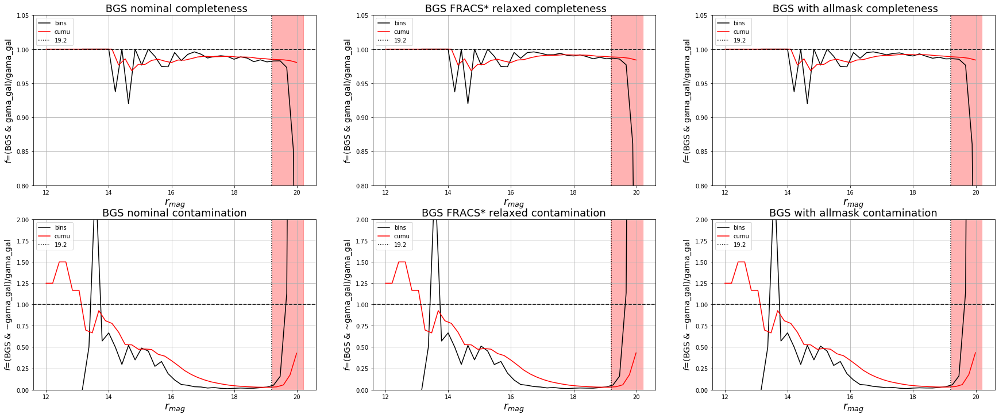

In [31]:
gama_assess_plot(pop=['QC_FM', 'QC_FI', 'QC_FF'], savefile='%s/%s'%(pathdir, 'gama_assess_comp_cont'))

GAMA & LS dr8: 1019.33 /deg^2
	 BGS nominal: 	 1422.400 /deg^2, \& in GAMA: 	 980.050 /deg^2
	 BGS FRACS* relaxed: 	 1433.317 /deg^2, \& in GAMA: 	 985.000 /deg^2
	 BGS with allmask: 	 1436.150 /deg^2, \& in GAMA: 	 985.000 /deg^2


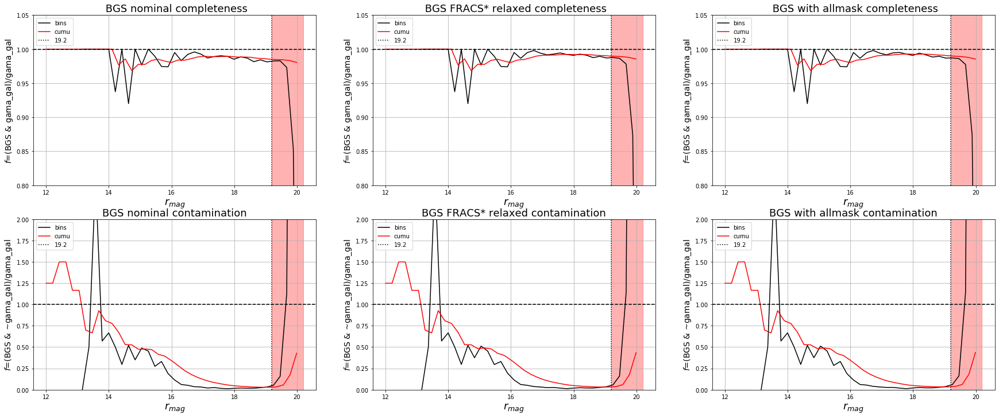

In [32]:
gama_assess_plot(pop=['LG', 'QC_FM', 'QC_FI', 'QC_FF'], savefile='%s/%s'%(pathdir, 'gama_assess_LG_comp_cont'))

In [33]:
def gama_assess_plot_2(pop=None, savefile=None, FracsReAllmask=True, FracsReAllmask_LG=True, comp=True):
    
    #pop = {'nominal':None, }
    
    gamagal = (ls_z > 0.002)
    #
    fig = plt.figure(figsize=(27, 8))
    
    print('GAMA & LS %s: %.2f /deg^2'%(dr, np.sum(ls_gama)/60))
    
    if FracsReAllmask:
        bgsbutfracs = bgsbut(bgsbits=lsing15['BGSBITS'], rmag=lsing15['RMAG'], pop=['QC_FM', 'QC_FI', 'QC_FF'], bgsmask=bgsmask(), rlimit=20)
        fracs_re = np.ones_like(lsing15, dtype=bool)
        for i in (14,15,16): 
            fracs_re &= ((lsing15['BGSBITS'] & 2**(i)) != 0)
        #BGS with fracs relaxed
        bgs_re = (bgsbutfracs) & (fracs_re)
        #BGS with allmask
        bgs_allmask = (bgsbutfracs) & (((lsing15['BGSBITS'] & 2**(4)) != 0))
        
        dictBGS = {'NEW FRACS*':bgs_re, 'ALLMASK & no FRACS':bgs_allmask}
        
    if FracsReAllmask_LG:
        bgsbutfracs = bgsbut(bgsbits=lsing15['BGSBITS'], rmag=lsing15['RMAG'], pop=['QC_FM', 'QC_FI', 'QC_FF', 'LG'], bgsmask=bgsmask(), rlimit=20)
        fracs_re = np.ones_like(lsing15, dtype=bool)
        for i in (14,15,16): 
            fracs_re &= ((lsing15['BGSBITS'] & 2**(i)) != 0)
        #BGS with fracs relaxed
        bgs_re_LG = (bgsbutfracs) & (fracs_re)
        #BGS with allmask
        bgs_allmask_LG = (bgsbutfracs) & (((lsing15['BGSBITS'] & 2**(4)) != 0))
        
        dictBGS_LG = {'NEW FRACS no LG*':bgs_re_LG, 'ALLMASK & no FRACS & no LG':bgs_allmask_LG}
        
    
    for num, cumu in enumerate([False, True]):
        
        if cumu: label = 'Cumulative'
        else: label = 'bins'
                
        plt.subplot(1, 2, num+1)
        if comp: plt.title(r' BGS completeness with GAMA (%s)' %(label), size=18)
        else: plt.title(r' BGS contamination with GAMA (%s)' %(label), size=18)
        plt.axvspan(19.2, 20.2, alpha=0.3, color='red')
        plt.axhline(1, ls='--', c='k')
        plt.axvline(19.2, ls=':', label='19.2', color='k')
        plt.xlabel(r'$r_{mag}$', size=25)
        if comp: plt.ylabel(r'$f$=(BGS & gama_gal)/gama_gal', size=20)
        else: plt.ylabel(r'$f$=(BGS & ~gama_gal)/gama_gal', size=20)
        
        for key, val in zip(pop.keys(), pop.values()):
            
            bgsbutx = bgsbut(bgsbits=lsing15['BGSBITS'], rmag=lsing15['RMAG'], pop=val, bgsmask=bgsmask(), rlimit=20)
            if not cumu: print('\t %s: \t %.3f /deg^2, \t in GAMA: \t %.3f /deg^2' % (key, np.sum(bgsbutx)/60, np.sum(bgsbutx & ls_gama)/60))
            rmagl, Ncomp, Ncont, Nincomp, Ngama_ls, Ntot = gama_assess(cat=lsing15, rmaglab='RMAG', match=ls_gama, gamagal=gamagal, mask=bgsbutx, cumu=cumu)
            
            if comp: plt.plot(rmagl, Ncomp/Ngama_ls, ls='-', label='%s' %(key))
            else: plt.plot(rmagl, Ncont/Ngama_ls, ls='-', label='%s' %(key))
            if not cumu: plt.legend()
            
        if FracsReAllmask:
            
            for key_ex, val_ex in zip(dictBGS.keys(), dictBGS.values()):
                
                if not cumu: print('\t %s: \t %.3f /deg^2, \t in GAMA: \t %.3f /deg^2' % (key_ex, np.sum(val_ex)/60, np.sum(val_ex & ls_gama)/60))
                
                rmagl, Ncomp, Ncont, Nincomp, Ngama_ls, Ntot = gama_assess(cat=lsing15, rmaglab='RMAG', match=ls_gama, gamagal=gamagal, mask=val_ex, cumu=cumu)
                if comp: plt.plot(rmagl, Ncomp/Ngama_ls, ls='-', label='%s' %(key_ex))
                else: plt.plot(rmagl, Ncont/Ngama_ls, ls='-', label='%s' %(key_ex))
                if not cumu: plt.legend()
                
        if FracsReAllmask_LG:
            
            for key_ex, val_ex in zip(dictBGS_LG.keys(), dictBGS_LG.values()):
                
                if not cumu: print('\t %s: \t %.3f /deg^2, \t in GAMA: \t %.3f /deg^2' % (key_ex, np.sum(val_ex)/60, np.sum(val_ex & ls_gama)/60))
                
                rmagl, Ncomp, Ncont, Nincomp, Ngama_ls, Ntot = gama_assess(cat=lsing15, rmaglab='RMAG', match=ls_gama, gamagal=gamagal, mask=val_ex, cumu=cumu)
                if comp: plt.plot(rmagl, Ncomp/Ngama_ls, ls='-', label='%s' %(key_ex))
                else: plt.plot(rmagl, Ncont/Ngama_ls, ls='-', label='%s' %(key_ex))
                if not cumu: plt.legend()
                

        if comp: plt.ylim(0.94, 1.02)
        else: plt.ylim(0, 1.25)
        plt.grid()
            
        if savefile is not None:
            fig.savefig(savefile+'.png', bbox_inches = 'tight', pad_inches = 0)


GAMA & LS dr8: 1019.33 /deg^2
	 Nominal: 	 1422.400 /deg^2, 	 in GAMA: 	 980.050 /deg^2
	 no LG: 	 1425.983 /deg^2, 	 in GAMA: 	 981.367 /deg^2
	 no FRACS*: 	 1434.300 /deg^2, 	 in GAMA: 	 984.167 /deg^2
	 no FRACS* & no LG: 	 1438.167 /deg^2, 	 in GAMA: 	 985.550 /deg^2
	 NEW FRACS*: 	 1429.550 /deg^2, 	 in GAMA: 	 983.633 /deg^2
	 ALLMASK & no FRACS: 	 1432.283 /deg^2, 	 in GAMA: 	 983.617 /deg^2
	 NEW FRACS no LG*: 	 1433.317 /deg^2, 	 in GAMA: 	 985.000 /deg^2
	 ALLMASK & no FRACS & no LG: 	 1436.150 /deg^2, 	 in GAMA: 	 985.000 /deg^2


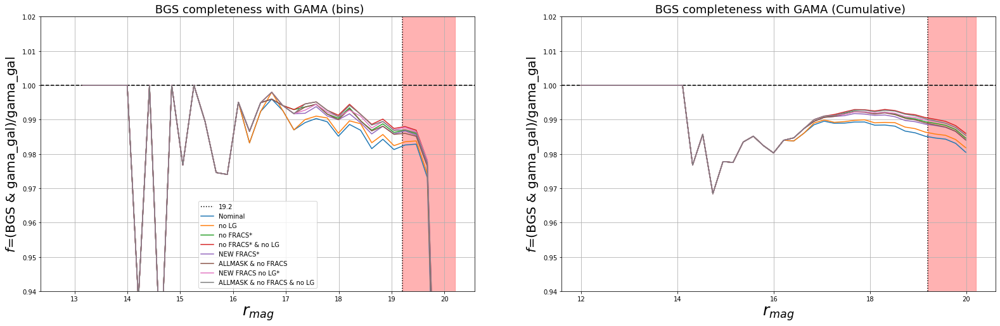

In [34]:
gama_assess_plot_2(pop={'Nominal':None, 'no LG':['LG'], 'no FRACS*':['QC_FM', 'QC_FI', 'QC_FF'], 'no FRACS* & no LG':['QC_FM', 'QC_FI', 'QC_FF', 'LG']}, savefile='%s/%s'%(pathdir, 'gama_assess_LG_comp_alltogether'))

GAMA & LS dr8: 1019.33 /deg^2
	 Nominal: 	 1422.400 /deg^2, 	 in GAMA: 	 980.050 /deg^2
	 no LG: 	 1425.983 /deg^2, 	 in GAMA: 	 981.367 /deg^2
	 no FRACS*: 	 1434.300 /deg^2, 	 in GAMA: 	 984.167 /deg^2
	 no FRACS* & no LG: 	 1438.167 /deg^2, 	 in GAMA: 	 985.550 /deg^2
	 NEW FRACS*: 	 1429.550 /deg^2, 	 in GAMA: 	 983.633 /deg^2
	 ALLMASK & no FRACS: 	 1432.283 /deg^2, 	 in GAMA: 	 983.617 /deg^2
	 NEW FRACS no LG*: 	 1433.317 /deg^2, 	 in GAMA: 	 985.000 /deg^2
	 ALLMASK & no FRACS & no LG: 	 1436.150 /deg^2, 	 in GAMA: 	 985.000 /deg^2


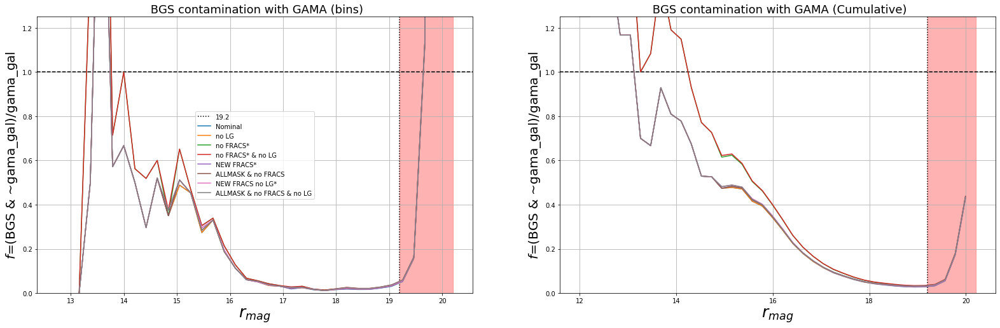

In [35]:
gama_assess_plot_2(pop={'Nominal':None, 'no LG':['LG'], 'no FRACS*':['QC_FM', 'QC_FI', 'QC_FF'], 'no FRACS* & no LG':['QC_FM', 'QC_FI', 'QC_FF', 'LG']}, savefile='%s/%s'%(pathdir, 'gama_assess_LG_comp_alltogether'), comp=False)

### What if we don't apply the LG mask? Do the completeness increases?

# 2D stacks around large galaxies

In [ ]:
sga = fitsio.read('/global/cfs/cdirs/cosmo/staging/largegalaxies/v3.0/SGA-ellipse-v3.0.fits')

In [35]:
#get SGA galaxies in north
from io_ import get_reg

lg = (sga['SGA_ID'] > 0)
SGA = sga[lg]

nside = 256
sga_hppix = hp.ang2pix(nside,(90.-SGA['DEC'])*np.pi/180.,SGA['RA']*np.pi/180.,nest=True)
sga_reg = get_reg(reg='north', hppix=sga_hppix)
sga_desi = get_reg(reg='desi', hppix=sga_hppix)
SGA = SGA[(sga_reg) & (sga_desi)]


In [41]:
LG = (cat['REF_CAT'] == 'L3')
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)

In [48]:
print('With respect to LG in SGA')
print('\t SWEEPS is %.2f %% complete' %(100*np.sum(LG)/len(SGA)))
print('\t BGS is %.2f %% complete' %(100*np.sum((LG) & (bgs_any))/len(SGA)))

With respect to LG in SGA
	 SWEEPS is 99.36 % complete
	 BGS is 99.06 % complete


In [46]:
bgslist = ['BS', 'LG', 'GC', 'nobs', 'SG', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF']
for cut in bgslist:
    veto = ((cat['BGSBITS'] & 2**(bgsmask()[cut])) == 0) & (LG)
    print('%s \t %i' %(cut, np.sum(veto)))

BS 	 259
LG 	 261
GC 	 2
nobs 	 0
SG 	 0
FMC2 	 11
CC 	 2
QC_FM 	 22
QC_FI 	 4
QC_FF 	 35


In [97]:
from io_ import match_coord
idx2, idx1, d2d, d_ra, d_dec = match_coord(cat['RA'], cat['DEC'], SGA['RA'], SGA['DEC'], search_radius=0.5)

Doubly matched objects = 0
Final matched objects = 91385


In [100]:
SGA_matched = np.zeros_like(SGA['RA'], dtype='?')
cat_matched = np.zeros_like(cat['RA'], dtype='?')

cat_matched[idx2.tolist()] = True
SGA_matched[idx1.tolist()] = True

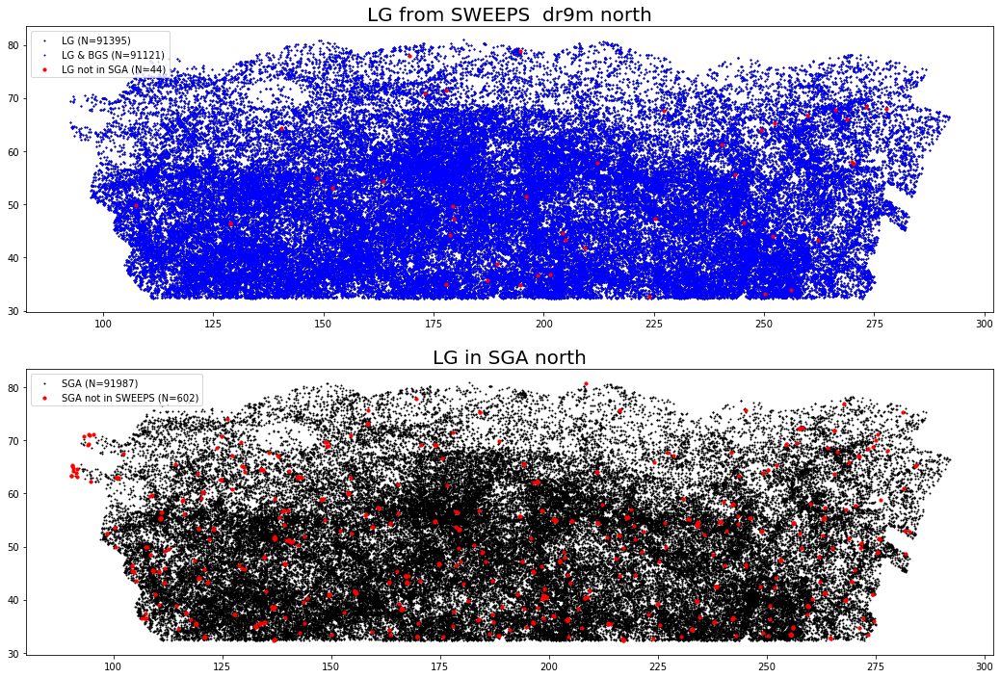

In [107]:
plt.figure(figsize=(18, 12))
plt.subplot(2,1,1)
plt.title(r'LG from SWEEPS  %s %s' %(dr, reg), size=20)
plt.scatter(cat['RA'][LG], cat['DEC'][LG], s=1, color='k', label='LG (N=%i)' %(np.sum(LG)))
plt.scatter(cat['RA'][(LG) & (bgs_any)], cat['DEC'][(LG) & (bgs_any)], s=1, color='b', label='LG & BGS (N=%i)' %(np.sum((LG) & (bgs_any))))
plt.scatter(cat['RA'][(LG) & (~cat_matched)], cat['DEC'][(LG) & (~cat_matched)], s=10, color='r', label='LG not in SGA (N=%i)' %(np.sum((LG) & (~cat_matched))))
plt.legend()
plt.subplot(2,1,2)
plt.title(r'LG in SGA %s' %(reg), size=20)
plt.scatter(SGA['RA'], SGA['DEC'], s=1, color='k', label='SGA (N=%i)' %(len(SGA)))
plt.scatter(SGA['RA'][~SGA_matched], SGA['DEC'][~SGA_matched], s=10, color='r', label='SGA not in SWEEPS (N=%i)' %(np.sum(~SGA_matched)))
plt.legend()


In [108]:
np.sum(SGA_matched)

91385

# DEV ZONE...

## Flow charts: Nominal & Galaxy View

In [20]:
#
for key in ['BS', 'LG', 'MS']:
    
    bgslist = ['BS', 'LG', 'GC', 'nobs', 'SG', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF']
    if key in bgslist: bgslist.remove(key)

    t = getStats(cat=cat, hpdict=hpdict0, bgsmask=bgsmask(), rancuts=rancuts, CurrentMask=[key], 
             PrevMask=None, reg=reg, regcat=catinreg, regran=raninreg)
    
    t2 = getStats(cat=cat, hpdict=hpdict0, bgsmask=bgsmask(), rancuts=rancuts, CurrentMask=[key], 
             PrevMask=bgslist, reg=reg, regcat=catinreg, regran=raninreg)
    
    print('%s: \t %.1f %% \t %.1f /sq.deg' %(key, t[0][1], t2[0][2]+t[0][3]))
    #print('------------------------------ ')
    

Previous Cuts: (None)
Current Cuts: (BS)
Previous Cuts: (LG|GC|nobs|SG|FMC2|CC|QC_FM|QC_FI|QC_FF)
Current Cuts: (BS)
BS: 	 0.6 % 	 7.2 /sq.deg
Previous Cuts: (None)
Current Cuts: (LG)
Previous Cuts: (BS|GC|nobs|SG|FMC2|CC|QC_FM|QC_FI|QC_FF)
Current Cuts: (LG)
LG: 	 0.1 % 	 8.7 /sq.deg
Previous Cuts: (None)
Current Cuts: (MS)
Previous Cuts: (BS|LG|GC|nobs|SG|FMC2|CC|QC_FM|QC_FI|QC_FF)
Current Cuts: (MS)
MS: 	 3.4 % 	 51.0 /sq.deg


In [21]:
#use below code to get target densities of keep and rejected at a particular stage in flowchart...
#use hpdict0 if density computed over the total area (before applyin spatial cuts in randoms)
#use hpdict if density computed over the reduced area (after applying spatial cuts in randoms)
if True:
    t = getStats(cat=cat, hpdict=hpdict0, bgsmask=bgsmask(), rancuts=rancuts, CurrentMask=['MS'], 
             PrevMask=['BS', 'LG', 'GC', 'nobs', 'SG', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF'], 
                 reg=reg, regcat=catinreg, regran=raninreg)
    
    print(t)
    area = hpdict0['bgsarea_'+reg]
    print('area in sq.deg removed by MS and excluding overlaped area with BS: \t %.1f' %(t[0][1]*area/100))
    print('BGS in objects/sq.deg rejected by MS and excluding overlaped area with BS: \t %.1f' %(t[0][2]+t[0][3]))

Previous Cuts: (BS|LG|GC|nobs|SG|FMC2|CC|QC_FM|QC_FI|QC_FF)
Current Cuts: (MS)
  GM   $f_{A}$ [$\%$] $\eta_{B}$ [deg$^2$] $\eta_{F}$ [deg$^2$]
------ -------------- -------------------- --------------------
    MS           2.75                 18.5                13.72
~(MS)*          96.32               786.12               570.06
 ~(MS)          96.32               816.18               591.86
area in sq.deg removed by MS and excluding overlaped area with BS: 	 1.4
BGS in objects/sq.deg rejected by MS and excluding overlaped area with BS: 	 32.2


In [11]:
if reg == 'south': surveylab = 'DECaLS+DES'
elif reg == 'north': surveylab = 'BASS-MzLS'
elif reg == 'desi': surveylab = 'DESI'
else: surveylab = reg
    
flowTitle = dr+'_'+surveylab

#this is important to read the area of the proper region in hpdict0
region = reg

Previous Cuts: (None)
Current Cuts: (BS|LG|GC)
Previous Cuts: (BS|LG|GC)
Current Cuts: (nobs)
Previous Cuts: (BS|LG|GC|nobs)
Current Cuts: (SG)
Previous Cuts: (BS|LG|GC|nobs|SG)
Current Cuts: (FMC2|CC)
Previous Cuts: (BS|LG|GC|nobs|SG|FMC2|CC)
Current Cuts: (QC_FM|QC_FI|QC_FF)
Previous Cuts: (BS|LG|GC|nobs|SG|FMC2|CC|QC_FM|QC_FI|QC_FF)
Current Cuts: (MS)


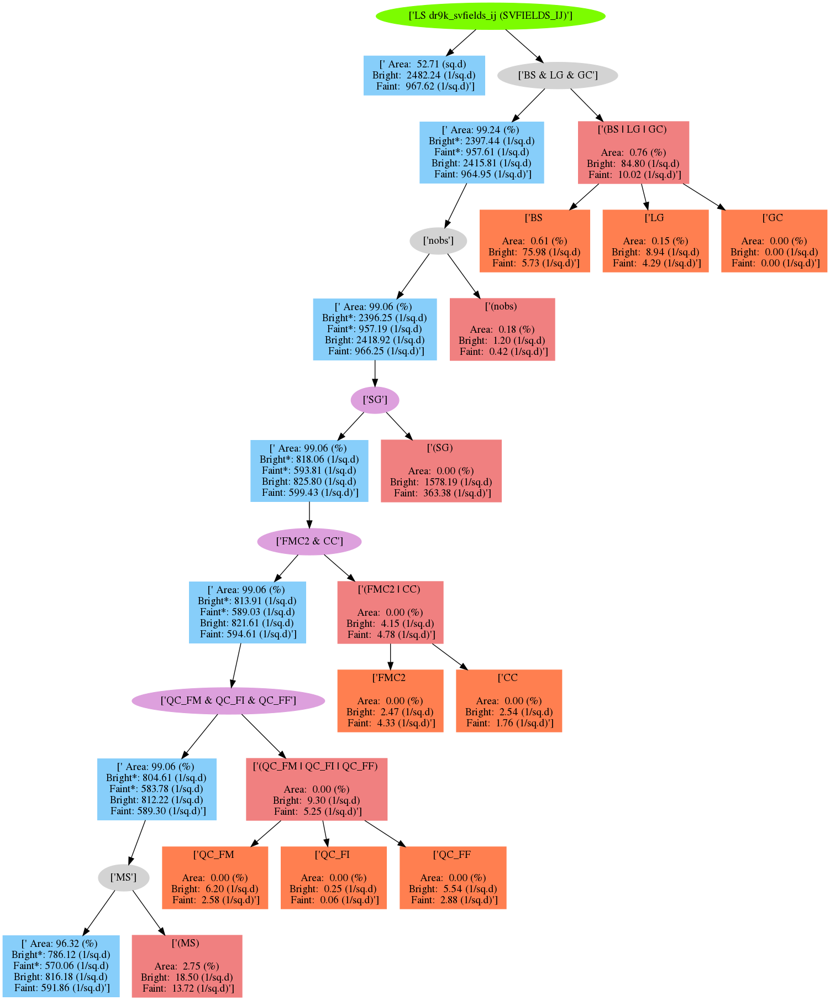

In [23]:
order = [['BS', 'LG', 'GC'], ['nobs'], ['SG'], ['FMC2', 'CC'], ['QC_FM', 'QC_FI', 'QC_FF'], ['MS']]


flowNominal, _, _ = flow(cat=cat, hpdict=hpdict0, bgsmask=bgsmask(), rancuts=rancuts, order=order, reg=region, 
             regcat=catinreg, regran=raninreg, file='%s/flow_main_nominal_%s' %(pathdir, flowTitle), dr=flowTitle, program='main')

flowNominal

Previous Cuts: (None)
Current Cuts: (SG)
Previous Cuts: (SG)
Current Cuts: (BS|LG|GC)
Previous Cuts: (SG|BS|LG|GC)
Current Cuts: (nobs)
Previous Cuts: (SG|BS|LG|GC|nobs)
Current Cuts: (QC_FM|QC_FI|QC_FF)
Previous Cuts: (SG|BS|LG|GC|nobs|QC_FM|QC_FI|QC_FF)
Current Cuts: (FMC2|CC)
Previous Cuts: (SG|BS|LG|GC|nobs|QC_FM|QC_FI|QC_FF|FMC2|CC)
Current Cuts: (MS)


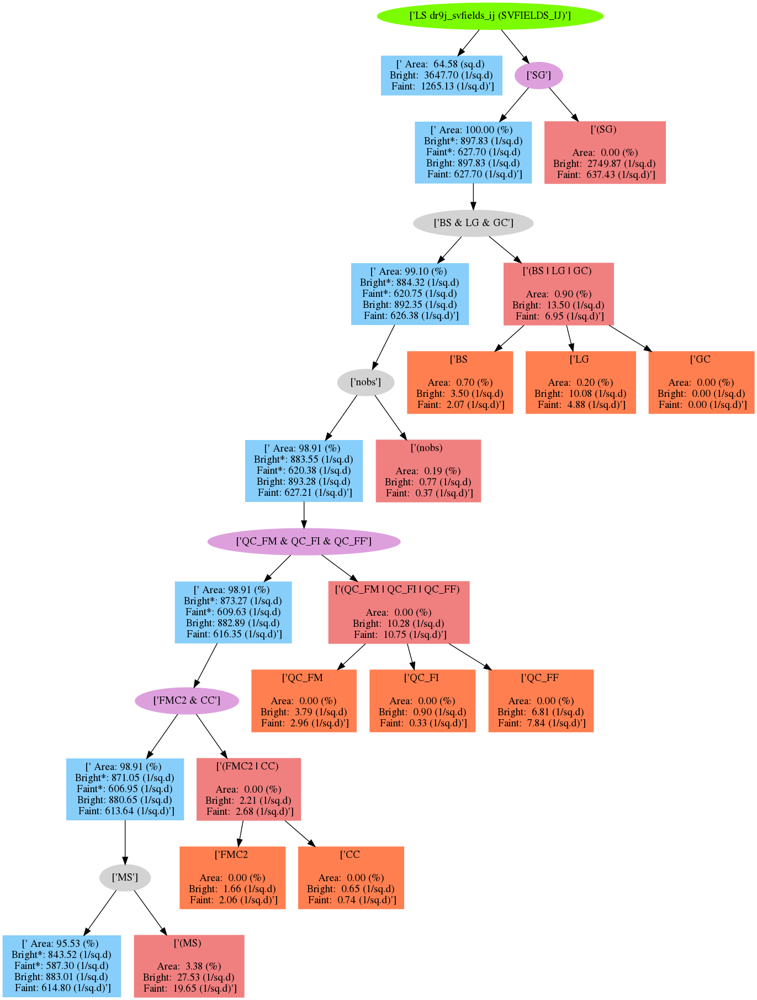

In [ ]:
order = [ ['SG'], ['BS', 'LG', 'GC'], ['nobs'], ['QC_FM', 'QC_FI', 'QC_FF'], ['FMC2', 'CC'], ['MS']]

flowGalview, _, _ = flow(cat=cat, hpdict=hpdict0, bgsmask=bgsmask(), rancuts=rancuts, order=order, reg=region, 
             regcat=catinreg, regran=raninreg, file='%s/flow_main_galview_%s' %(pathdir,flowTitle), dr=flowTitle, program='main')

flowGalview

## 2D-stacks around Bright Stars and Medium Stars

Firs we do the stacking around the bright stars (`BS mask`) using BGS but `BS`. 

For the second stacking, we use BGS and do the stacking around the Medium Stars (`MS mask`).

In [ ]:
#star catalogue
stars = np.load('/global/cscratch1/sd/qmxp55/pauline/stars_GAIA_TYCHO_13.npy')

In [ ]:
hppix_stars = hp.ang2pix(nside,(90.-stars['DEC'])*np.pi/180.,stars['RA']*np.pi/180.,nest=True) # catalogue hp pixels array
if reg == 'svfields_fg': starsinreg = get_svfields_fg(stars['RA'], stars['DEC'])
elif reg == 'svfields_ij': starsinreg = get_svfields_ij(stars['RA'], stars['DEC'], survey=survey)
else: starsinreg = get_reg(reg=reg, hppix=hppix_stars)
#cstars = SkyCoord(stars['RA']*units.degree,stars['DEC']*units.degree, frame='icrs')
#galb_stars = cstars.galactic.b.value # galb coordinate
stars = stars[(starsinreg) & (stars['DEC'] > -25)]

In [2]:
#Dustin_radii's
mag = np.linspace(0, 20, 50)
BS_radii = []
new_BS_radii = []
for i,j in enumerate(mag):
    BS_radii.append([j, np.minimum(1800., 150. * 2.5**((11. - j)/3.)) * 0.262/1])
    new_BS_radii.append([j, 0.5 * np.minimum(1800., 150. * 2.5**((11. - j)/3.)) * 0.262/1])

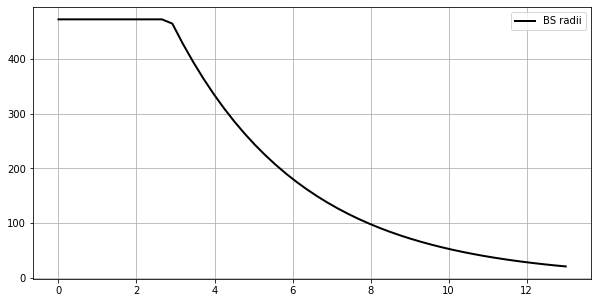

In [7]:
mag = np.linspace(0, 13, 50)
BS_radii = []
for i,j in enumerate(mag):
    BS_radii.append([j, np.minimum(1800., 150. * 2.5**((11. - j)/3.)) * 0.262/1])
    
plt.figure(figsize=(10,5))
plt.plot(np.transpose(BS_radii)[0], np.transpose(BS_radii)[1], lw=2, c='k', label='BS radii')

plt.legend()
plt.grid()


In [ ]:
bgsbutBS = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['BS'], bgsmask=bgsmask(), rlimit=20)

In [ ]:
#
#bgslist = ['LG', 'GC', 'nobs', 'SG', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF']
    
# get BGS objects without BS bit set on
#bgsbutBS = np.ones_like(cat['RA'], dtype=bool)

#for key in bgslist:
#    keep = ((cat['BGSBITS'] & 2**(bgsmask()[key])) != 0)
#    bgsbutBS &= keep
#bgsbutBS &= cat['RMAG'] < 20
    
#%time bgsbutBS = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['BS'], bgsmask=bgsmask(), rlimit=20)
    
log = True
nbins = 101
    
    #radius = np.minimum(1800., 150. * 2.5**((11. - mag)/3.)) * 0.262/3600.
        
plt.figure(figsize=(18, 9))
plt.title(r'%s %s' %('%s' %(dr), '%s' %(surveylab)), size=25)
plt.axis('off')
_ = overdensity(cat[bgsbutBS], stars, new_BS_radii, 'MAG', 35, density=False, 
                        magbins=[8,12, 13], radii_2=BS_radii, grid=[1,2], SR=[0., 1000.], scaling=True, nbins=nbins, 
                               SR_scaling=3,logDenRat=[-4, 4], radii_bestfit=False, annulus=None, bintype='0', 
                                   filename='%s/2d_stack_BS_%s_%s' %(pathdir, dr, survey), log=log)


### Close up at bump for $\vec{r}/r_{BS} > 1$

mag_bins_len: 1
5.00 < MAG < 13.00
MARK #1
MARK #2
mag_radii MAX: 110.00796871418599 mag_radii MIN: 10.679157108492952
mag MAX: 12.999820709228516 mag MIN: 5.363476753234863
d2d min=0.106, d2d max=93.6
73332 73332 73332
density cumu (min, max): (nan, nan)
density non-cumu (min, max): (-2, 0.106)
209 of inf in density ratio out of a total of 4792
Minimum density ratio = -4, Maximum density ratio = 1.72739
----------------
47 47


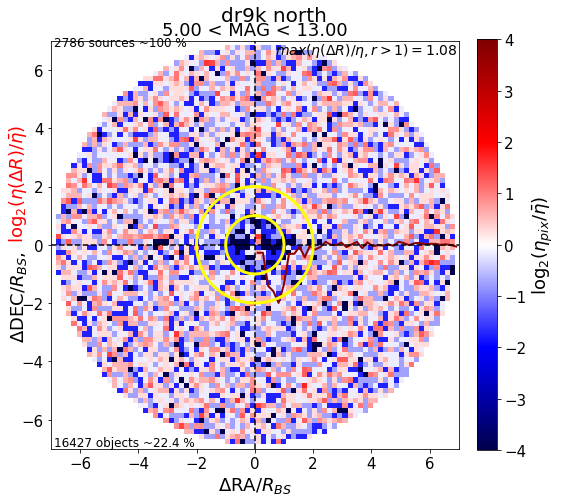

In [29]:
#
#
if True:
    bgsbutBS = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['BS'], bgsmask=bgsmask(), rlimit=20)

    log = True
    nbins = 81

    plt.figure(figsize=(8,8))
    plt.title(r'%s %s' %(dr, survey), size=20)
    plt.axis('off')
    d2d, d_ra2, d_dec2, annMask = overdensity(cat[bgsbutBS], stars, new_BS_radii, 'MAG', 35, density=False, 
                            magbins=[5,13], radii_2=None, grid=[1,1], SR=[0., 1000.], scaling=True, nbins=nbins, 
                                   SR_scaling=7,logDenRat=[-4, 4], radii_bestfit=False, annulus=[1.0, 2.0], bintype='0', 
                                       filename='%s/2d_stack_BS_%s_%s_1_1.5' %(pathdir, dr, survey), log=log)
    
    
    #
    #
    annmask = np.zeros_like(cat['RA'], dtype=bool)
    d2d2 = np.zeros_like(cat['RA'])
    #bgsbutBS objects in annulus. Boolean with size of entire catalogue
    annmask[np.where(bgsbutBS)] = annMask
    d2d2[np.where(bgsbutBS)] = d2d

    print(np.sum(annMask), np.sum(annmask))

In [53]:
#

if True:
    
    from postages_images import html_postages

    veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}

    layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]

    masks = {'rmag<19':(BS_diff) & (bgsbutBS) & (cat['RMAG'] < 19), 'rmag>19':(BS_diff) & (bgsbutBS) & (cat['RMAG'] > 19)}

    idx = list(np.where(annmask))[0]
    print('sample size: %i' %(len(idx)))

    #
    html_postages(cat=cat, coord=[cat['RA'], cat['DEC']], idx=idx, notebook=True, savefile='%s/BGSbutBS_in_bump_5<G<13' %(pathdir), 
                  htmltitle='%s/BGSbutBS_in_bump_5<G<13' %(pathdir), veto=veto, grid=[5,6], m=4, radius=4/3600, 
                      comparison=None, layer_list=layer_list)

sample size: 30


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr9j-south_svfields_ij_0.1.0_draft_plots/BGSbutBS_in_bump_5<G<13.html
32.0 122


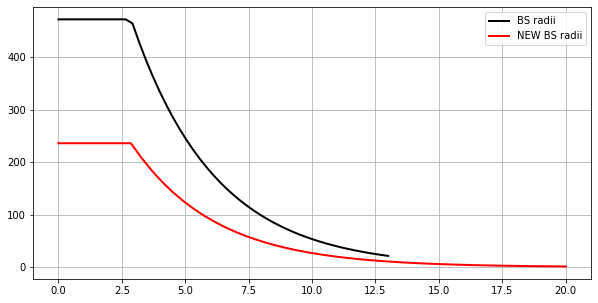

In [6]:
#
if True:
    plt.figure(figsize=(10,5))

    plt.plot(np.transpose(BS_radii)[0], np.transpose(BS_radii)[1], lw=2, c='k', label='BS radii')
    plt.plot(np.transpose(new_BS_radii)[0], np.transpose(new_BS_radii)[1], lw=2, c='r', label='NEW BS radii')

    plt.legend()
    plt.grid()


In [30]:
#
from QA import circular_mask_radii_func
from io_ import query_catalog_mask

BS_t = query_catalog_mask(cat['RA'], cat['DEC'], stars, BS_radii, nameMag='MAG', diff_spikes=False, 
                             length_radii=None, widht_radii=None, return_diagnostics=True, bestfit=False, log=False)
#
new_BS_t = query_catalog_mask(cat['RA'], cat['DEC'], stars, new_BS_radii, nameMag='MAG', diff_spikes=False, 
                             length_radii=None, widht_radii=None, return_diagnostics=True, bestfit=False, log=False)
#masking radius for each object cloosest stars in cat
mask_radii = circular_mask_radii_func(BS_t[1]['w1_source'], BS_radii, bestfit=False)
#masking radius reescaled for each object
mask_radii_res = BS_t[1]['d2d_source']/mask_radii
#
BS_diff = (BS_t[0]) & (~new_BS_t[0]) & (cat['RMAG'] < 20)
PSF = ((cat['TYPE'] == 'PSF') | (cat['TYPE'] == 'PSF ')) 
refcat = cat['REF_CAT']
if isinstance(np.atleast_1d(refcat)[0], str):
    LG = [(rc[0] == "L") if len(rc) > 0 else False for rc in refcat]
else:
    LG = [(rc.decode()[0] == "L") if len(rc) > 0 else False for rc in refcat]

print('objects within BS radii defs & r<20: \t %i (PSF) \t %i (no-PSF) \t %i (LSLGA)' 
      %(np.sum((BS_diff) & (PSF)), np.sum((BS_diff) & (~PSF)), np.sum((BS_diff) & (LG))))
print('objects within BS radii defs & r<20 & BGS: \t %i (PSF) \t %i (no-PSF) \t %i (LSLGA)' 
      %(np.sum((BS_diff) & (PSF) & (bgsbutBS)), np.sum((BS_diff) & (~PSF) & (bgsbutBS)), np.sum((BS_diff) & (LG))))


Total run time: 0.590595 sec
Total run time: 0.627936 sec
objects within BS radii defs & r<20: 	 1480 (PSF) 	 872 (no-PSF) 	 5 (LSLGA)
objects within BS radii defs & r<20 & BGS: 	 20 (PSF) 	 827 (no-PSF) 	 5 (LSLGA)


$\Delta \vec{r}/r_{BS}$

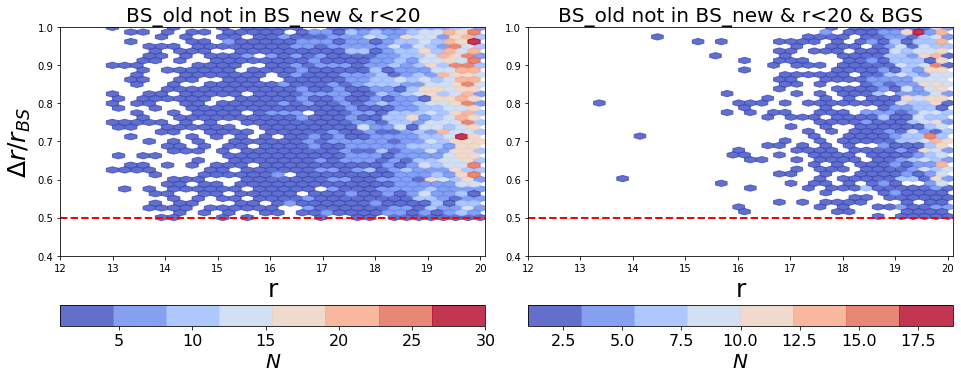

In [ ]:
#
rows, cols = 1, 2
coord = {'r':cat['RMAG'], '$\Delta r/r_{BS}$':mask_radii_res}
area = hpdict0['bgsarea_'+survey]

#debug = cat['RMAG'] < 16
masks = {'BS_old not in BS_new & r<20':(BS_diff), 'BS_old not in BS_new & r<20 & BGS':(BS_diff) & (bgsbutBS)}
hline, vline = 0.5, None
vmin, vmax = 1, None
    
fig    = plt.figure(figsize=(8*cols,6*rows))
gs     = gridspec.GridSpec(rows, cols, hspace=0.25, wspace=0.10)
cmap = plt.get_cmap('coolwarm', 8)
    
for i, key, val in zip(range(len(masks)), masks.keys(), masks.values()):
        
    if (i%cols==0): ylab=True
    else: ylab = False
        
    hexbin(coord=coord, catmask=(val), n=i, bins=None, title=key, cmap=cmap, 
               ylab=ylab, xlab=True, vline=vline, hline=hline, fig=fig, gs=gs, vmin=vmin, vmax=vmax, mincnt=1, fmcline=False, 
                   file='%s/r_mask_radii_BSold_not_BSnew_%s' %(pathdir, survey), fracs=False, area=area, cbar='horizontal',
                      xlim=[12, 20.1], ylim=[0.4, 1.0], gridsize=(30,20))
    

In [ ]:
#
from postages_images import html_postages

veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}

layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]

masks = {'rmag<19':(BS_diff) & (bgsbutBS) & (cat['RMAG'] < 19), 'rmag>19':(BS_diff) & (bgsbutBS) & (cat['RMAG'] > 19)}

for key, val in zip(masks.keys(), masks.values()):

    idx = list(np.where(val))[0]
    print('sample size: %i' %(len(idx)))
        
    #
    html_postages(cat=cat, coord=[cat['RA'], cat['DEC']], idx=idx, notebook=True, savefile=pathdir+'/diff_BS_larger_smaller_radii_%s' %(key), 
              htmltitle='/diff_BS_larger_smaller_radii_%s' %(key), veto=veto, grid=[4,6], m=4, radius=4/3600, 
                  comparison=None, layer_list=layer_list)

sample size: 533


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr9j-south_svfields_ij_0.1.0_draft_plots/diff_BS_larger_smaller_radii_rmag<19.html
32.0 122


sample size: 1108


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr9j-south_svfields_ij_0.1.0_draft_plots/diff_BS_larger_smaller_radii_rmag>19.html
32.0 122


### Medium BS

In [41]:
from io_ import get_msmask
from io_ import get_bsmask
from io_ import search_around

#load mask sources objects from SWEEPS DR8
masksources = np.load('/global/cscratch1/sd/qmxp55/bgstargets_output/dr8/dr8_sweep_whole_maskbitsources.npy')

In [42]:
%time hppix_masksources = hp.ang2pix(nside,(90.-masksources['DEC'])*np.pi/180.,masksources['RA']*np.pi/180.,nest=True) # catalogue hp pixels array
if reg == 'svfields_fg': masksourcesinreg = get_svfields_fg(masksources['RA'], masksources['DEC'])
elif reg == 'svfields_ij': masksourcesinreg = get_svfields_ij(masksources['RA'], masksources['DEC'], survey=survey)
else: masksourcesinreg = get_reg(reg=reg, hppix=hppix_masksources)

#cstars = SkyCoord(stars['RA']*units.degree,stars['DEC']*units.degree, frame='icrs')
#galb_stars = cstars.galactic.b.value # galb coordinate
masksources = masksources[(masksourcesinreg) & (masksources['DEC'] > -25)]

CPU times: user 9.99 s, sys: 14.1 s, total: 24.1 s
Wall time: 24 s


In [43]:
#get the medium bright stars
%time starsMS = get_msmask(masksources)

1669 nearby objects
3366809 Medium Bright Stars
CPU times: user 3.65 s, sys: 558 ms, total: 4.21 s
Wall time: 3.62 s


In [44]:
%time hppix_starsMS = hp.ang2pix(nside,(90.-starsMS['DEC'])*np.pi/180.,starsMS['RA']*np.pi/180.,nest=True) # catalogue hp pixels array
if reg == 'svfields_fg': starsMSinreg = get_svfields_fg(starsMS['RA'], starsMS['DEC'])
elif reg == 'svfields_ij': starsMSinreg = get_svfields_ij(starsMS['RA'], starsMS['DEC'], survey=survey)
else: starsMSinreg = get_reg(reg=reg, hppix=hppix_starsMS)

#cstars = SkyCoord(stars['RA']*units.degree,stars['DEC']*units.degree, frame='icrs')
#galb_stars = cstars.galactic.b.value # galb coordinate
starsMS = starsMS[(starsMSinreg) & (starsMS['DEC'] > -25)]

CPU times: user 372 ms, sys: 13.7 ms, total: 386 ms
Wall time: 193 ms


In [1]:
#
log = True
nbins = 101

bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)
#bgsbutBS = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['BS'], bgsmask=bgsmask(), rlimit=20)
#print(np.sum((bgsbutBS) & (~BS_t[0])))
#print(np.sum((bgs_any) & (~BS_t[0])))
        
plt.figure(figsize=(8, 8))
plt.title(r'%s %s' %(dr, survey), size=20)
plt.axis('off')
_ = overdensity(cat[(bgs_any)], starsMS, BS_radii, 'MAG', 35, density=False, 
                        magbins=[13,16], radii_2=new_BS_radii, grid=[1,1], SR=[0., 500], scaling=True, nbins=nbins, 
                               SR_scaling=7,logDenRat=[-4, 4], radii_bestfit=False, annulus=[1,2], bintype='0', 
                                   filename='%s/2d_stack_MS_%s_%s' %(pathdir, dr, survey), log=log)

NameError: name 'cat' is not defined

### Differences in magnitude for GAIA and Tycho2

3998 nearby objects
974002 Bright Stars
G2 970004
T2 3998
b'G2' 73126951
b'L2' 218852
b'T2' 3998


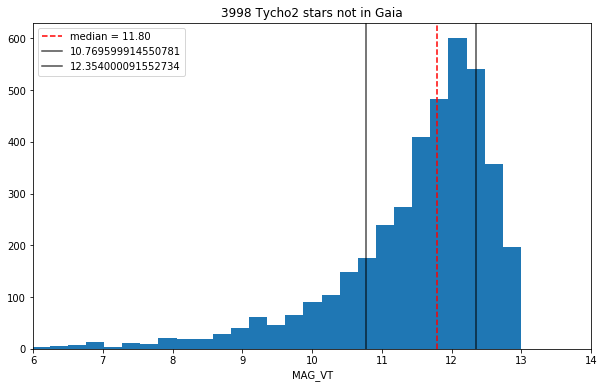

152367 nearby objects
152367 152367


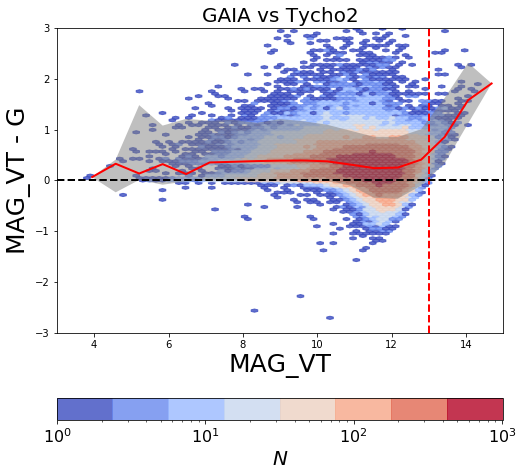

In [32]:
#
if True:
    
    starsBS = get_bsmask(masksources)

    hppix_starsBS = hp.ang2pix(nside,(90.-starsBS['DEC'])*np.pi/180.,starsBS['RA']*np.pi/180.,nest=True) # catalogue hp pixels array
    if reg == 'svfields_fg': starsBSinreg = get_svfields_fg(starsBS['RA'], starsBS['DEC'])
    elif reg == 'svfields_ij': starsBSinreg = get_svfields_ij(starsBS['RA'], starsBS['DEC'], survey=survey)
    else: starsBSinreg = get_reg(reg=reg, hppix=hppix_starsBS)

    #cstars = SkyCoord(stars['RA']*units.degree,stars['DEC']*units.degree, frame='icrs')
    #galb_stars = cstars.galactic.b.value # galb coordinate
    starsBS = starsBS[(starsBSinreg) & (starsBS['DEC'] > -25)]

    #
    for i in set(starsBS['REF_CAT'][:10000]):
        print(i, np.sum(starsBS['REF_CAT'] == i))

    for i in set(masksources['REF_CAT'][:100000]):    
        print(i, np.sum(masksources['REF_CAT'] == i))

    mask = starsBS['REF_CAT'] == 'T2'
    
    fig = plt.figure(figsize=(10, 6))
    plt.title(r'%i Tycho2 stars not in Gaia' %(np.sum(mask))) 
    plt.hist(starsBS['MAG'][mask], 50)
    
    xmin, xmax = np.percentile(starsBS['MAG'][mask], (20, 80))
    #plt.axvline(13)
    xmedian = np.median(starsBS['MAG'][mask])
    plt.axvline(xmedian, ls='--', color='r', label='median = %.2f' %(xmedian))
    plt.axvline(xmin, color='k', alpha=0.7, label=xmin)
    plt.axvline(xmax, color='k', alpha=0.7, label=xmax)
    plt.xlabel(r'MAG_VT')
    plt.xlim(6,14)
    plt.legend()
    plt.show()

    ##
    #
    magG = np.zeros_like(masksources['RA'])
    magT = np.zeros_like(masksources['RA'])
    ingaia = (masksources['REF_CAT'] == b'G2') & (masksources['G'] <= 13)
    intycho = (masksources['REF_CAT'] == b'T2')

    # get MAG_VT mag from Tycho
    path = '/global/homes/q/qmxp55/DESI/matches/'
    tycho = fitsio.read(path+'tycho2.fits')
    idx2, idx1, d2d, d_ra, d_dec = search_around(masksources['RA'][ingaia], masksources['DEC'][ingaia], tycho['RA'], tycho['DEC'], search_radius=0.3)


    magT = tycho['MAG_VT'][idx1]
    magG = masksources['G'][ingaia][idx2]
    #magT[np.where(intycho)] = tycho['MAG_VT'][idx1]
    #magG[np.where(ingaia)] = masksources['G'][ingaia]

    print(len(magT), len(magG))

    ####

    #
    coord = {'MAG_VT':magT, 'MAG_VT - G':(magT - magG)}

    fig    = plt.figure(figsize=(8*1,8*1))
    gs     = gridspec.GridSpec(1, 1, hspace=0.15, wspace=0.10)
    cmap = plt.get_cmap('coolwarm', 8)

    ax, _, _ = hexbin(coord=coord, catmask=None, n=0, bins='log', title='GAIA vs Tycho2', cmap=cmap, 
                   ylab=True, vline=13, hline=None, fig=fig, gs=gs, vmin=None, vmax=None, mincnt=1, 
                       file=None, fracs=False, area=None, cbar='horizontal', xlim=[3, 15], ylim=[-3, 3], showmedian=True)

    ax.axhline(0, lw=2, ls='--', c='k')
    

In [37]:
#
def rad(m):
    return 39.3*2.5**((11-m)/3)

print(rad(3)-rad(3.4))
print(rad(13)-rad(13.4))

52.03297590631598
2.45364636424787


## Grr vs g-z: bgsbutSG

In [26]:
#bgslist = ['BS', 'LG', 'GC', 'nobs', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF', 'QC_IVAR']
    
## get BGS objects without BS bit set on
#bgsbutSG = np.ones_like(cat['RA'], dtype=bool)

#for key in bgslist:
#    keep = ((cat['BGSBITS'] & 2**(bgsmask()[key])) != 0)
#    bgsbutSG &= keep
#bgsbutSG &= cat['RMAG'] < 20

bgsbutSG = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['SG'], bgsmask=bgsmask(), rlimit=20)

finite = np.ones_like(cat['RMAG'], dtype='?')
for i in ['RMAG', 'GMAG', 'ZMAG','FLUX_R', 'RFIBERMAG']:
    finite &= np.isfinite(cat[i])
    

In [27]:
Ared = hpdict['bgsarea_'+reg]

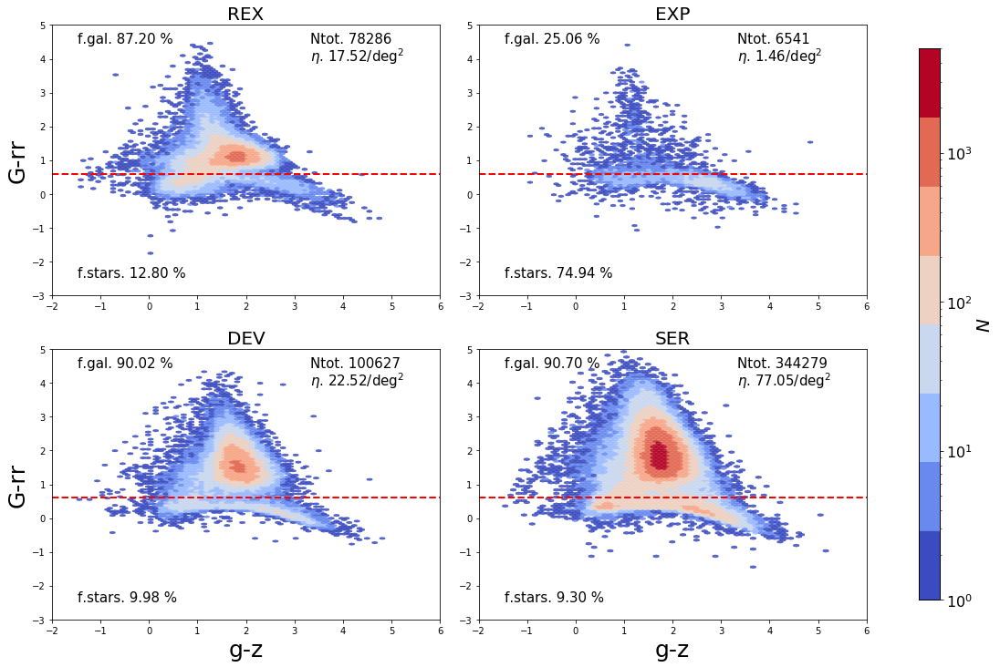

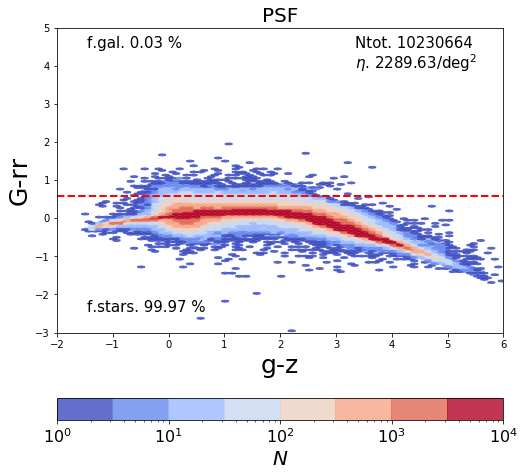

In [29]:
#
Grr = cat['G'] - flux_to_mag(cat['FLUX_R'])
coord = {'g-z':cat['GMAG'] - cat['ZMAG'], 'G-rr':Grr}
PSF = (cat['TYPE'] == 'PSF ') | (cat['TYPE'] == 'PSF') 
#if dr[:3] == 'dr9': morphos = ['REX', 'EXP', 'DEV', 'SER']
#else: morphos = ['REX ', 'EXP ', 'DEV ', 'COMP']
rows, cols = 2, 2
#debug = cat['RMAG'] < 16
mask = (catinreg) & (bgsbutSG) & (finite) #& (debug)
hline, vline = 0.6, None
vmin, vmax = 1, None
    
fig    = plt.figure(figsize=(8*cols,6*rows))
gs     = gridspec.GridSpec(rows, cols, hspace=0.2, wspace=0.10)
cmap = plt.get_cmap('coolwarm', 8)
    
for i, morpho in enumerate(morphos):
        
    if (i%cols==0): ylab=True
    else: ylab = False
    if (morpho == PSF): 
        vmax, cbar = None, 'vertical'
    else:
        vmax, cbar = 5000, 'panel'
        
    if i < 2: xlab = False
    else: xlab = True
        
    morphomask = cat['TYPE'] == morpho
    hexbin(coord=coord, catmask=((mask) & (morphomask)), n=i, bins='log', title=morpho, cmap=cmap, 
               ylab=ylab, xlab=xlab, vline=vline, hline=hline, fig=fig, gs=gs, vmin=vmin, vmax=vmax, mincnt=1, 
                   file='%s/gz_Grr_bgsbutSG_hexbin_extended_%s' %(pathdir, survey), fracs=True, area=Ared, cbar=cbar)

fig    = plt.figure(figsize=(8*1,8*1))
gs     = gridspec.GridSpec(1, 1, hspace=0.15, wspace=0.10)

hexbin(coord=coord, catmask=((mask) & (PSF)), n=0, bins='log', title='PSF', cmap=cmap, 
               ylab=True, vline=vline, hline=hline, fig=fig, gs=gs, vmin=None, vmax=10000, mincnt=1, 
                   file='%s/gz_Grr_bgsbutSG_hexbin_psf_%s' %(pathdir, survey), fracs=True, area=Ared, cbar='horizontal')
        

## rmag vs rfibmag: bgsbutFMC

In [30]:
#bgslist = ['BS', 'LG', 'GC', 'nobs', 'SG', 'CC', 'QC_FM', 'QC_FI', 'QC_FF', 'QC_IVAR']
    
## get BGS objects without BS bit set on
#bgsbutFMC2 = np.ones_like(cat['RA'], dtype=bool)

#for key in bgslist:
#    keep = ((cat['BGSBITS'] & 2**(bgsmask()[key])) != 0)
#    bgsbutFMC2 &= keep
#bgsbutFMC2 &= cat['RMAG'] < 20

bgsbutFMC2 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['FMC2'], bgsmask=bgsmask(), rlimit=20)


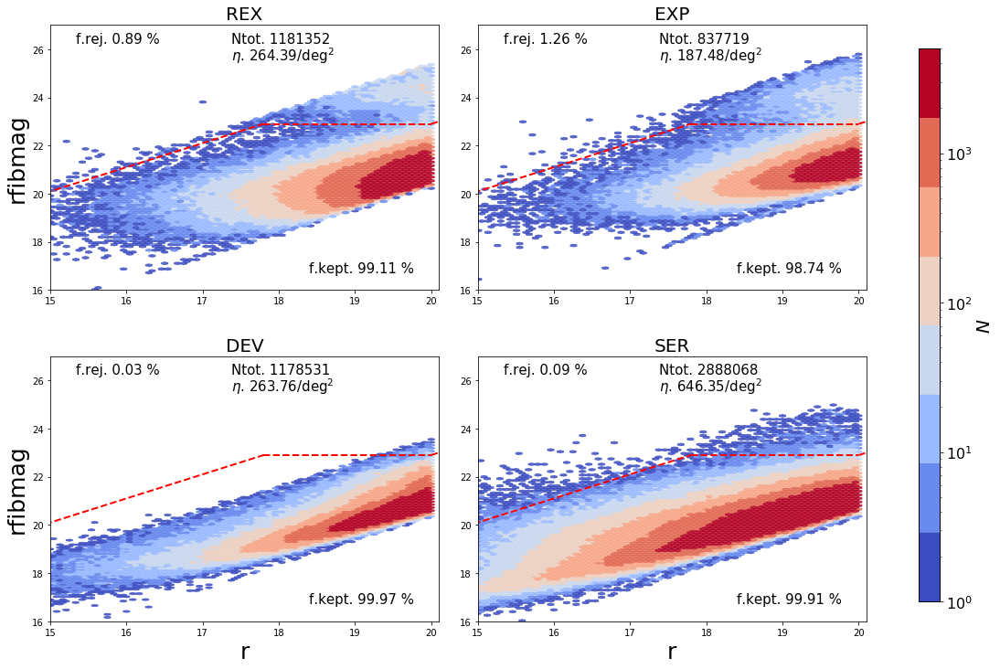

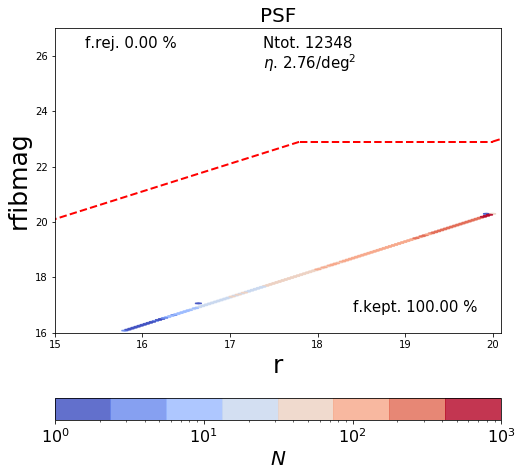

In [34]:
#
rows, cols = 2, 2
coord = {'r':cat['RMAG'], 'rfibmag':cat['RFIBERMAG']}

#debug = cat['RMAG'] < 16
mask = (catinreg) & (bgsbutFMC2) & (finite) #& (debug)
hline, vline = None, None
vmin, vmax = 1, 200
    
fig    = plt.figure(figsize=(8*cols,6*rows))
gs     = gridspec.GridSpec(rows, cols, hspace=0.25, wspace=0.10)
cmap = plt.get_cmap('coolwarm', 8)
    
for i, morpho in enumerate(morphos):
        
    if (i%cols==0): ylab=True
    else: ylab = False
    if morpho == PSF: 
        vmax, cbar = None, 'vertical'
    else:
        vmax, cbar = 5000, 'panel'
        
    if i < 2: xlab = False
    else: xlab = True
        
    morphomask = cat['TYPE'] == morpho
    hexbin(coord=coord, catmask=((mask) & (morphomask)), n=i, bins='log', title=morpho, cmap=cmap, 
               ylab=ylab, xlab=xlab, vline=vline, hline=hline, fig=fig, gs=gs, vmin=vmin, vmax=vmax, mincnt=1, fmcline=True, 
                   file='%s/r_rfibmag_bgsbutFMC2_hexbin_extended_%s' %(pathdir, survey), fracs=False, area=Ared, cbar=cbar)
    
    
fig    = plt.figure(figsize=(8*1,8*1))
gs     = gridspec.GridSpec(1, 1, hspace=0.15, wspace=0.10)

hexbin(coord=coord, catmask=((mask) & (PSF)), n=0, bins='log', title='PSF', cmap=cmap, 
               ylab=True, vline=vline, hline=hline, fig=fig, gs=gs, vmin=None, vmax=1000, mincnt=1, fmcline=True,
                   file='%s/r_rfibmag_bgsbutFMC2_hexbin_psf_%s' %(pathdir, survey), fracs=False, area=Ared, cbar='horizontal')
        

## g-r vs r-z: bgsbutCC

In [32]:

bgsbutCC = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['CC'], bgsmask=bgsmask(), rlimit=20)


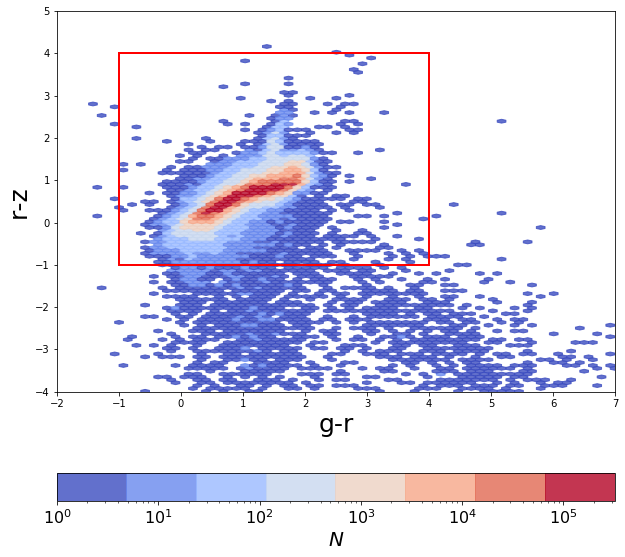

In [33]:
#
import matplotlib.patches as patches

coord = {'g-r':cat['GMAG'] - cat['RMAG'], 'r-z':cat['RMAG'] - cat['ZMAG']}
mask = (catinreg) & (bgsbutCC) & (finite) # & (cat['RMAG'] < 14)

fig   = plt.figure(figsize=(10,10))
gs     = gridspec.GridSpec(1, 1, hspace=0.15, wspace=0.10)


hexbin(coord=coord, catmask=mask, n=0, bins='log', title=None, cmap=cmap, 
               ylab=True, vline=None, hline=None, fig=fig, gs=gs, xlim=(-2, 7), ylim=(-4, 5), 
                   vmin=None, vmax=None, mincnt=1, fmcline=False,
                       file=None, fracs=False, area=Ared, cbar='horizontal')

plt.plot(np.linspace(-1, 4, 3), np.full(3, -1), lw=2, c='r')
plt.plot(np.linspace(-1, 4, 3), np.full(3, 4), lw=2, c='r')

plt.plot(np.full(3, -1), np.linspace(-1, 4, 3), lw=2, c='r')
plt.plot(np.full(3, 4), np.linspace(-1, 4, 3), lw=2, c='r')

file='%s/gr_rz_bgsbutCC_hexbin_%s' %(pathdir, survey)
fig.savefig(file, bbox_inches = 'tight', pad_inches = 0)



## Venn diagrams: QCs

In [ ]:
from QA import plot_venn3

In [ ]:
# get BGS but QCs
bgsbutQCs = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM', 'QC_FI', 'QC_FF'], bgsmask=bgsmask(), rlimit=20)
FM = ((cat['BGSBITS'] & 2**(11)) == 0) #rejects by FM
FI = ((cat['BGSBITS'] & 2**(12)) == 0) #rejects by FI
FF = ((cat['BGSBITS'] & 2**(13)) == 0) #rejects by FF
area = hpdict0['bgsarea_'+survey]

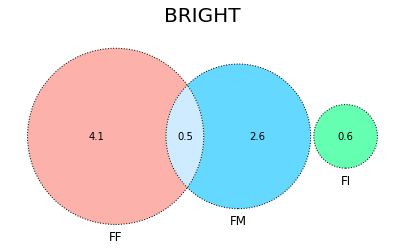

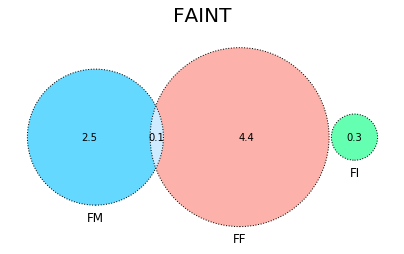

In [ ]:
#
keepB = (bgsbutQCs) & (cat['RMAG'] < 19.5)
keepF = (bgsbutQCs) & (cat['RMAG'] > 19.5) & (cat['RMAG'] < 20)
plot_venn3(A=(keepB & FM), B=(keepB & FI), C=(keepB & FF), norm=area, 
           labels=['FM', 'FI', 'FF'], file=pathdir+'/venn_QCs_bright_%s' %(survey), title='BRIGHT', colors = ['deepskyblue', 'springgreen', 'salmon'])
plot_venn3(A=(keepF & FF), B=(keepF & FI), C=(keepF & FM), norm=area, 
           labels=['FF', 'FI', 'FM'], file=pathdir+'/venn_QCs_faint_%s' %(survey), title='FAINT', colors = ['salmon' ,'springgreen', 'deepskyblue'])


# AEN vs G-rr star-galaxy classification in GAIA

Tractor force to fit as PSF the GAIA objects that satisfy the following conditions:

* For $G<19$: astrometric_excess_noise $< 10^{0.5}$, 

* For $G≥19$: astrometric_excess_noise $ < 10^{0.5+0.2(G−19)}$.
    
G is the GAIA photometric $G$-band and the astrometric excess noise ($AEN$) is the...
Those PSF that are in GAIA are treated as Stars according to TRACTOR and the GAIA objects that do not fulfill that condition are treated as GALAXIES. This is different to the way we do star-galaxy separation for BGS, we use GAIA but rather than look at the $AEN$ we look at the colour distribution $G-rr$.

The PSF GAIA objects (from above definition) are treated differently than other PSF objects and they have a local fitting, the problem is that maybe those are not stars and might be galaxies instead that photometry is being altered by this local fitting.

Here we are going to find out what are the differences between our star-galaxy classification and the one above for GAIA objects.
We're going to:

* $Grr$ distributions for $Grr$ class and $AEN$ class:
    * All
    * TRACTOR PSF
    * TRACTOR No PSF
* Heat maps
* Venn diagram's
* Galleries of mismatches divided in `TRACTOR PSF` and `TRACTOR non-PSF`:
    * Stars with $Grr$ class and Galaxies with $AEN$ class
    * Galaxies with $Grr$ class and Stars with $AEN$ class

In [ ]:
inGAIA = (cat['REF_CAT'] == 'G2') & (cat['RMAG'] < 20)
grr_gal = ((cat['BGSBITS'] & 2**(6)) != 0) & (cat['RMAG'] < 20)
grr_stars = ((cat['BGSBITS'] & 2**(6)) == 0) & (cat['RMAG'] < 20)
AEN_star, AEN_gal = gaiaAEN(inGAIA=inGAIA, size=len(cat['RA']), G=cat['G'], AEN=cat['AEN'], dr=dr)
PSF = (cat['TYPE'] == 'PSF ') | (cat['TYPE'] == 'PSF')

#inGAIA2 = (cat['G'] != 0)

In [ ]:
#
coord = {'G':cat['G'], r'$\log(AEN)$':np.log10(cat['AEN'])}
#masks = [(grr_stars) & (inGAIA) & (cat['RMAG'] < 14), (grr_gal) & (inGAIA) & (cat['RMAG'] < 14)]
masks = [(grr_stars) & (inGAIA), (grr_gal) & (inGAIA)]
titles = ['stars with G-rr (r < 20)', 'galaxies with G-rr (r < 20)']
vmin, vmax = 1, None
    
fig    = plt.figure(figsize=(9*len(masks), 7))
gs     = gridspec.GridSpec(1, len(masks),hspace=0.1,wspace=0.10)
cmap = plt.get_cmap('coolwarm', 8)
xlim=[10, 22]
ylim=[-2, 1.5]

for i, mask in enumerate(masks):
        
    #if (i%len(masks)==0): xlab=True
    #else: xlab = False
    #if morpho == 'PSF ': vmax = None
        
    #morphomask = cat['TYPE'] == morpho
    hexbin(coord=coord, catmask=mask, n=i, bins='log', title=titles[i], cmap=cmap, xlab=True,
               ylab=True, vline=None, hline=None, fig=fig, gs=gs, vmin=vmin, vmax=vmax, mincnt=1, fmcline=False, 
                   file=None, area=None, xlim=xlim, ylim=ylim, cbar='horizontal')
    
    #if i == 0:
    #    x, y = coord.keys()
    #    mask1 = (gaia_star) & (dr8_gama) & (dr8_z > 0.002) & (bgs)
    #    mask2 = (gaia_star) & (dr8_gama) & (dr8_z > 0.002) & (~bgs)
    #    plt.scatter(coord[x][mask2], coord[y][mask2], s=2, c='royalblue', label=r'Not in BGS')
    #    plt.scatter(coord[x][mask1], coord[y][mask1], s=2, c='k', label=r'in BGS')
    #    plt.legend()
    
    x_ = np.linspace(19, xlim[1], 4)
    plt.plot(np.linspace(xlim[0], 18, 3), np.full(3, 0.5), color='r', ls='-', lw=2)
    plt.plot(np.full(3, 18), np.linspace(ylim[0], 0.5, 3), color='r', ls='-', lw=2)
    plt.plot(x_, 0.5 + 0.2*(x_ - 19.), color='r', ls='--', lw=2, alpha=0.7)
    plt.plot(np.linspace(18,19,3), np.full(3, 0.5), color='r', ls='--', lw=2, alpha=0.7)

file = pathdir+'/G_logAEN'
fig.savefig(file+'.png', bbox_inches = 'tight', pad_inches = 0)

* How many galaxies (i.e. G-rr > 0.6) that are AEN stars? Are these real galaxies?
* How many SDSS & GAMA "truth" galaxies are AEN star? plot SDSS & GAMA galaxies on top of above plot.
    * how many of above in G-rr > 0.6?
    * how many of above in G-rr < 0.6?
    

In [ ]:
#
area = hpdict0['bgsarea_'+survey]
BS = ((cat['BGSBITS'] & 2**(0)) != 0)
gal_in_aenstar = (inGAIA) & (grr_gal) & (cat['G'] < 18)*(np.log10(cat['AEN']) < 0.5)
print('G-rr > 0.6 & in GAIA & G < 18 & AEN < 10**(0.5): \t %i, \t %.3f (1/deg^2)' 
      %(np.sum(gal_in_aenstar), np.sum(gal_in_aenstar)/area))
print('G-rr > 0.6 & in GAIA & G < 18 & AEN < 10**(0.5) & BS: \t %i, \t %.3f (1/deg^2)' 
      %(np.sum(gal_in_aenstar & (BS)), np.sum(gal_in_aenstar & (BS))/area))
print('G-rr > 0.6 & in GAIA & G < 18 & AEN < 10**(0.5) & BGS: \t %i, \t %.3f (1/deg^2)' 
      %(np.sum(gal_in_aenstar & (bgs_any)), np.sum(gal_in_aenstar & (bgs_any))/area))

In [ ]:
if False:

    #
    veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}

    info = {'r':cat['RMAG'], 'T':cat['TYPE'].astype(str), 'ref':cat['REF_CAT'].astype(str)}
    layer = dr+'-'+survey
    #'dr8-model'
    #'dr8-resid'
    #layer2=layer+'-model'

    idx = list(np.where((gal_in_aenstar) & (bgs_any)))[0]
    print('sample size: %i' %(len(idx)))

    #if we want to compare the same objects with another catalogue (i.e., DR7, DR8) select only
    #the right number of indexes as your grid to avoid the random selection in postages_circle.
    postages_circle(coord=[cat['RA'], cat['DEC']], centeridx=idx, veto=veto, info=info, scale=0.262, 
                    scale_unit='pixscale', layer=layer, radius=4/3600., m=2, grid=[2,5], 
                        savefile='%s/%s_Grr_gal_AEN_stars' %(pathdir, layer), layer2=layer+'-resid', layer2Mode='merge', 
                            isLG=False, title=None, markers=False, colorkey=True)

In [ ]:
#
fig = plt.figure(figsize=(18,12))

log = True
Grr = cat['G'] - flux_to_mag(cat['FLUX_R'])

classes = {'stars_Grr':(grr_stars) & (inGAIA), 'gal_Grr':(grr_gal) & (inGAIA), 'stars_aen': (AEN_star) & (cat['RMAG'] < 20), 'gal_aen':(AEN_gal) & (cat['RMAG'] < 20), 
              'stars_Grr_PSF':(grr_stars) & (inGAIA) & (PSF), 'gal_Grr_PSF':(grr_gal) & (inGAIA) & (PSF),
                  'stars_aen_PSF':(AEN_star) & (PSF) & (cat['RMAG'] < 20), 'gal_aen_PSF':(AEN_gal) & (PSF) & (cat['RMAG'] < 20),
                      'stars_Grr_noPSF':(grr_stars) & (inGAIA) & (~PSF), 'gal_Grr_noPSF':(grr_gal) & (inGAIA) & (~PSF),
                          'stars_aen_noPSF':(AEN_star) & (~PSF) & (cat['RMAG'] < 20), 'gal_aen_noPSF':(AEN_gal) & (~PSF) & (cat['RMAG'] < 20)}

for i, j in enumerate(['Grr', 'aen', 'Grr_PSF', 'aen_PSF', 'Grr_noPSF', 'aen_noPSF']):

    XS = (classes['stars_' + j])
    XG = (classes['gal_' + j])
    tot_gaia = np.sum((inGAIA))

    plt.subplot(3, 2, i+1)
    
    if i == 0:
        plt.title(r'$G-rr$ classification (r < 20)', size=22)
    if i == 1:
        plt.title(r'$AEN$ classification (r < 20)', size=22)
    
    bins = np.linspace(-2.1, 5, 60)
        
    plt.hist(Grr[XS], bins=bins, log=log, alpha=0.7, label='%s stars, $f$=%2.3g' %(j, np.sum(XS)/tot_gaia))
    plt.hist(Grr[XG], bins=bins, log=log, alpha=0.4, label='%s galaxies, $f$=%2.3g' %(j, np.sum(XG)/tot_gaia))
    if i == 0:
        plt.axvline(0.6, ls='--', lw=2, c='k', label='SG threshold, Grr = 0.6')
        plt.text(-2.1, 2*10**7, '$N_{tot}$=%s' %(tot_gaia))
    plt.axvline(0.6, ls='--', lw=2, c='k')
    if (i == 4) or (i == 5):
        plt.xlabel(r'$G-rr$', size=20)
    if i == 2:
        plt.ylabel(r'$N$', size=20)    
    plt.legend()

plt.show()
filename = '%s/gaia_Grr_comparison_with_aen' %(pathdir)
fig.savefig(filename+'.png') #bbox_inches = 'tight', pad_inches = 0


In [ ]:
from matplotlib_venn import venn2, venn2_circles

fig = plt.figure(figsize=(5,5))

sf = 2
area = hpdict0['bgsarea_'+survey]

a = classes['gal_Grr']
b = classes['gal_aen']
c = (a) & (b)

a1 = round(((np.sum(a) - np.sum(c))/area), sf)
b1 = round(((np.sum(b) - np.sum(c))/area), sf)
c1 = round(np.sum(c)/area, sf)

plt.title(r'GALAXIES', size=18)
labels = ('Grr', 'AEN')
   
venn2([a1, b1, c1], set_labels = labels)
c=venn2_circles([a1, b1, c1], linestyle='solid', linewidth=1, color="k")

filename = '%s/venn_gaia_Grr_comparison_with_aen' %(pathdir)
fig.savefig(filename+'.png', bbox_inches = 'tight', pad_inches = 0) 


# Galleries


In [17]:
grid = [6,5]

## Gallery BGS cuts

In [18]:
if True:
    
    # Bokeh basics 
    from bokeh.io import curdoc, show
    from bokeh.models.widgets import Tabs
    from postages_images import html_postages

    if not os.path.exists(pathdir+'/'+'galleries'):
        os.mkdir(pathdir+'/'+'galleries')
        
    bgs_mk = {'BS':'Bright stars mask',
          'LG':'Large galaxies mask',
          'GC':'Globular Clusters mask',
          'nobs':'Number of obeservations mask',
          'SG':'Star-galaxy separation',
          'FMC2':'Fibre magnitude cut',
          'CC':'Colour-colour cuts',
          'QC_FM':'Fracmasked cut',
          'QC_FI':'Fracin cut',
          'QC_FF':'Fracflux cut'}
    
    cat2 = cut(200, 260, 0, 30, cat)
    cat1 = cut(200, 230, 0, 20, cat)
        
    tabs = []
    bgslist = ['BS', 'LG', 'GC', 'nobs', 'SG', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF']
    
    for key in bgslist:
        
        if key in ['nobs']: df = cat2
        else: df = cat1
            
        bgs_any = ((df['BGSBITS'] & 2**(20)) != 0)
        
        #if key == 'BS': bgsbutx = bgsbut_bs
        #elif key == 'LG': bgsbutx = bgsbut_lg
        
        bgsbutx = bgsbut(bgsbits=df['BGSBITS'], rmag=df['RMAG'], pop=[key], bgsmask=bgsmask(), rlimit=19.7)
        veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}
        layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]

        
        select = (bgsbutx) & (~bgs_any)
        idx = list(np.where(select))[0]
        print('%s: \t %i' %(key, len(idx)))
        name = '%s_sample' %(key)
        main_text = 'Here we have a gallery with samples of DECaLS DR8 objects rejected by the %s in BGS. The objects at the centre of each postage image are not being rejected by any other BGS cut (in other words, these objects are only rejected by the %s).' %(bgs_mk[key], bgs_mk[key])
        buttons_text = 'select which images and object \n markers you want to display'
        
        #
        tab = html_postages(cat=df, coord=[df['RA'], df['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                            htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                            layer_list=layer_list, title='Sample galaxies/objects rejected by %s' %(bgs_mk[key]), tab=True, 
                            tab_title=key, main_text=main_text, buttons_text=buttons_text)
        
        tabs.append(tab)
        


BS: 	 5149


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/BS_sample.html
32.0 122
LG: 	 1557


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/LG_sample.html
32.0 122
GC: 	 464


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/GC_sample.html
32.0 122
nobs: 	 68


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/nobs_sample.html
32.0 122
SG: 	 1145892


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/SG_sample.html
32.0 122
FMC2: 	 1851


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/FMC2_sample.html
32.0 122
CC: 	 740


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/CC_sample.html
32.0 122
QC_FM: 	 2389


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/QC_FM_sample.html
32.0 122
QC_FI: 	 396


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/QC_FI_sample.html
32.0 122
QC_FF: 	 2295


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/QC_FF_sample.html
32.0 122


## Gallerries: discrepancies between GAIA SG separation and TRACTOR's

In [19]:
Grr = cat1['G'] - flux_to_mag(cat1['FLUX_R'])
PSF = (cat1['TYPE'] == 'PSF ') | (cat1['TYPE'] == 'PSF')
inGAIA = (cat1['REF_CAT'] == 'G2') & (cat1['RMAG'] < 20)
bgsbutSG = bgsbut(bgsbits=cat1['BGSBITS'], rmag=cat1['RMAG'], pop=['SG'], bgsmask=bgsmask(), rlimit=19.7)
bgs_any = ((cat1['BGSBITS'] & 2**(20)) != 0)

In [20]:
#
select1 = (bgsbutSG) & (~PSF) & (Grr < 0.6) & (inGAIA) & (cat1['RMAG'] < 19)
select2 = (bgs_any) & (PSF) & (~inGAIA) & (cat1['RMAG'] < 19)
select3 = (bgs_any) & (PSF) & (inGAIA) & (cat1['RMAG'] < 19)

#print(np.sum(select1))
#print(np.sum(select2))
#print(np.sum(select3))

#sg_gaia_tractor = {}

#for key in [select1, select2, select3]:
    
veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}
layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]


#select = (bgsbutx) & (~bgs_any)
idx = list(np.where(select1))[0]

name = 'noPSF_noBGS_gaia_grr<0.6'
print('%s: \t %i' %(name, len(idx)))
title = 'Discrepancies between Gaia Star-galaxy separation with TRACTORs: Gaia & noPSF & noBGS'
tab_title = 'Fail SG'
main_text = 'This gallery shows examples of TRACTORs extended (not PSF-type) objects from DECaLS DR8, that are Gaia sources too, and that did not end up in BGS catalogue because this objects did not pass our Gaia star-galaxy thresshold G-rr > 0.6.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab1 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)

#
idx = list(np.where(select2))[0]

name = 'PSF_BGS_nogaia'
print('%s: \t %i' %(name, len(idx)))
title = 'Discrepancies between Gaia Star-galaxy separation with TRACTORs: noGaia & PSF & BGS'
tab_title = 'Pass SG & noGaia'
main_text = 'This gallery shows examples of TRACTORs point source (PSF-type) objects from DECaLS DR8, that are not Gaia sources, but that did end up in BGS catalogue because this objects did pass our Gaia star-galaxy thresshold G-rr > 0.6.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab2 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)

#
idx = list(np.where(select3))[0]

name = 'PSF_BGS_gaia'
print('%s: \t %i' %(name, len(idx)))
title = 'Discrepancies between Gaia Star-galaxy separation with TRACTORs: Gaia & PSF & BGS'
tab_title = 'Pass SG & Gaia'
main_text = 'This gallery shows examples of TRACTORs point source (PSF-type) objects from DECaLS DR8, that are Gaia sources, but that did end up in BGS catalogue because this objects did pass our Gaia star-galaxy thresshold G-rr > 0.6.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab3 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)

tabs.append(tab1)
tabs.append(tab2)
tabs.append(tab3)


noPSF_noBGS_gaia_grr<0.6: 	 288


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/noPSF_noBGS_gaia_grr<0.6.html
32.0 122
PSF_BGS_nogaia: 	 499


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/PSF_BGS_nogaia.html
32.0 122
PSF_BGS_gaia: 	 303


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/PSF_BGS_gaia.html
32.0 122


## Galleries: discrepancy between G-rr star-galaxy classification and the AEN classification

In [21]:
#
inGAIA = (cat1['REF_CAT'] == 'G2') & (cat1['RMAG'] < 20)
grr_gal = ((cat1['BGSBITS'] & 2**(6)) != 0) & (cat1['RMAG'] < 20)
grr_stars = ((cat1['BGSBITS'] & 2**(6)) == 0) & (cat1['RMAG'] < 20)
AEN_star, AEN_gal = gaiaAEN(inGAIA=inGAIA, size=len(cat1['RA']), G=cat1['G'], AEN=cat1['AEN'], dr=dr)
bgsbutSG = bgsbut(bgsbits=cat1['BGSBITS'], rmag=cat1['RMAG'], pop=['SG'], bgsmask=bgsmask(), rlimit=20)
bgs_any = ((cat1['BGSBITS'] & 2**(20)) != 0)

AEN_disc = {'Grr galaxy & AEN star':(grr_gal) & (inGAIA) & (AEN_star) & (cat1['RMAG'] < 20) & (bgsbutSG),
            'Grr star & AEN galaxy':(grr_stars) & (inGAIA) & (AEN_gal) & (cat1['RMAG'] < 20) & (bgsbutSG)}
    

In [22]:
#
veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}
layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]


name = 'Grr galaxy & AEN star'
idx = list(np.where(AEN_disc[name]))[0]

print('%s: \t %i' %(name, len(idx)))
title = 'Discrepancies between Gaia Star-galaxy separation with TRACTORs Gaia point source classification (i.e. AEN classification): %s' %(name)
tab_title = 'AEN star'
main_text = 'This gallery shows examples of TRACTORs objects from DECaLS DR8, that are Gaia sources too, and that are targeted as galaxies according to our Gaia star-galaxy classification but classified as stars according to TRACTORs assessment of stars and galaxies for Gaia oobjects using the Astrometric Excess Noise (AEN) parameter from the Gaia DR2 catalogue.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab4 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)


#

name = 'Grr star & AEN galaxy'
idx = list(np.where(AEN_disc[name]))[0]

print('%s: \t %i' %(name, len(idx)))
title = 'Discrepancies between Gaia Star-galaxy separation with TRACTORs Gaia point source classification (i.e. AEN classification): %s' %(name)
tab_title = 'AEN galaxy'
main_text = 'This gallery shows examples of TRACTORs objects from DECaLS DR8, that are Gaia sources too, and that are targeted as stars according to our Gaia star-galaxy classification but classified as galaxies according to TRACTORs assessment of stars and galaxies for Gaia oobjects using the Astrometric Excess Noise (AEN) parameter from the Gaia DR2 catalogue.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab5 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)


Grr galaxy & AEN star: 	 1077


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/Grr galaxy & AEN star.html
32.0 122
Grr star & AEN galaxy: 	 9902


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/Grr star & AEN galaxy.html
32.0 122


In [23]:
#
tabs.append(tab4)
tabs.append(tab5)

## Galleries: BGS sample

In [24]:
#
bgs_any = ((cat1['BGSBITS'] & 2**(20)) != 0)

veto = {'BGS':(bgs_any),'Not BGS':(~bgs_any)}
layer_list = ['%s-%s' %(dr, survey), '%s-%s-model' %(dr, survey), '%s-%s-resid' %(dr, survey)]


name = 'BGS bright'
select = (bgs_any) & (cat1['RMAG'] < 19.5)
idx = list(np.where(select))[0]

print('%s: \t %i' %(name, len(idx)))
title = 'BGS Bright examples'
tab_title = 'BGS bright'
main_text = 'This gallery shows examples of BGS bright (r < 19.5) targets from DECaLS DR8.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab6 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)

#
name = 'BGS faint'
select = (bgs_any) & (cat1['RMAG'] > 19.5) & (cat1['RMAG'] < 20)
idx = list(np.where(select))[0]

print('%s: \t %i' %(name, len(idx)))
title = 'BGS Faint examples'
tab_title = 'BGS faint'
main_text = 'This gallery shows examples of BGS faint (19.5 < r < 20) targets from DECaLS DR8.'
buttons_text = 'select which images and object \n markers you want to display'

#
tab7 = html_postages(cat=cat1, coord=[cat1['RA'], cat1['DEC']], idx=idx, notebook=True, savefile='%s/galleries/%s' %(pathdir,name), 
                          htmltitle='%s/galleries/%s' %(pathdir,name), veto=veto, grid=grid, m=4, radius=4/3600, comparison=None, 
                          layer_list=layer_list, title=title, tab=True, tab_title=tab_title, main_text=main_text, buttons_text=buttons_text)


BGS bright: 	 520075


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/BGS bright.html
32.0 122
BGS faint: 	 343951


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/BGS faint.html
32.0 122


In [25]:
#
tabs.append(tab6)
tabs.append(tab7)

## Stack tabs

In [ ]:
#
import bokeh.plotting as bk
savefile = savefile='%s/galleries/%s' %(pathdir,'main')

bk.output_notebook()
if savefile is not None:
    html_page = savefile + '.html'
    bk.output_file(html_page, title=savefile)
    print(html_page)
    
#from bokeh.io import curdoc, show
# Put all the tabs into one application
tabs2 = Tabs(tabs=tabs)

# Put the tabs in the current document for display
#curdoc().add_root(tabs2)
show(tabs2)


Loading BokehJS ...

/global/project/projectdirs/desi/users/qmxp55/bgstargets/doc/dr8-south_south_0.1.0_draft_plots/galleries/main.html


# Systematics

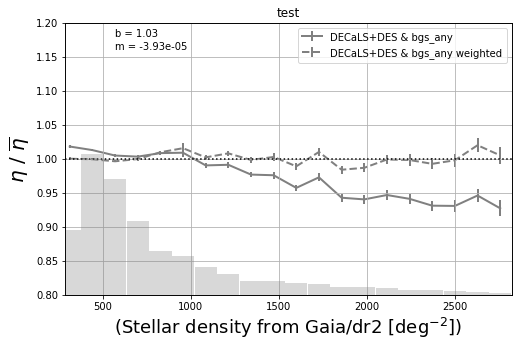

In [17]:
#
if reg[:8] == 'svfields': reg_ = reg+'_'+survey[0]
else: reg_ = reg

fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict['isdesi']) & (hpdict['bgsfracarea']>0) #this should be rename as "mainreg"
nx         = 20

b0, m0 = plot_sysdens(hpdicttmp=hpdict, namesels=['bgs_any'], regs=[reg_], syst='stardens', mainreg=isdesi, 
                      xlim=None, n=0, nx=nx, clip=True, denslims=False, ylab=True, weights=True, 
                          fig=fig, gs=gs, title='test', label=True)

In [49]:
#dic WEIGHTED

ws = 1./((m0)*hpdict['stardens'] + b0)

hpdict_ws = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels={'bgs_any':20, 'bright':21, 'faint':22}, 
                                  galb=cat_ex['b'], log=True, survey='bgs', ws=ws)

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  68230483
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / bgs_any
computing for  north / bright
computing for  north / faint
target densities in north DONE...
computing for  south / bgs_any
computing for  south / bright
computing for  south / faint
target densities in south DONE...
meandens_bgs_any_all = 1398 /deg2
meandens_bgs_any_des = nan /deg2
meandens_bgs_any_decals = nan /deg2
meandens_bgs_any_north = 1398 /deg2
meandens_bgs_any_south = nan /deg2
meandens_bgs_any_svfields = 1370 /deg2
meandens_bgs_any_svfields_n = 1370 /deg2
meandens_bgs_any_svfields_s = nan /deg2
meandens_bright_all = 824 /deg2
meandens_bright_des = nan /deg2
meandens_bright_decals = nan /deg2
meandens_bright_north = 824 /deg2
meandens_bright_south = nan /deg2
meandens_bright_svfields = 798 /deg2
meandens_bright_svfields_n = 798 /deg2
meandens_bright_svfields_s = nan /deg2
meandens_faint_all = 574 /

In [18]:
from QA import pixhistregs

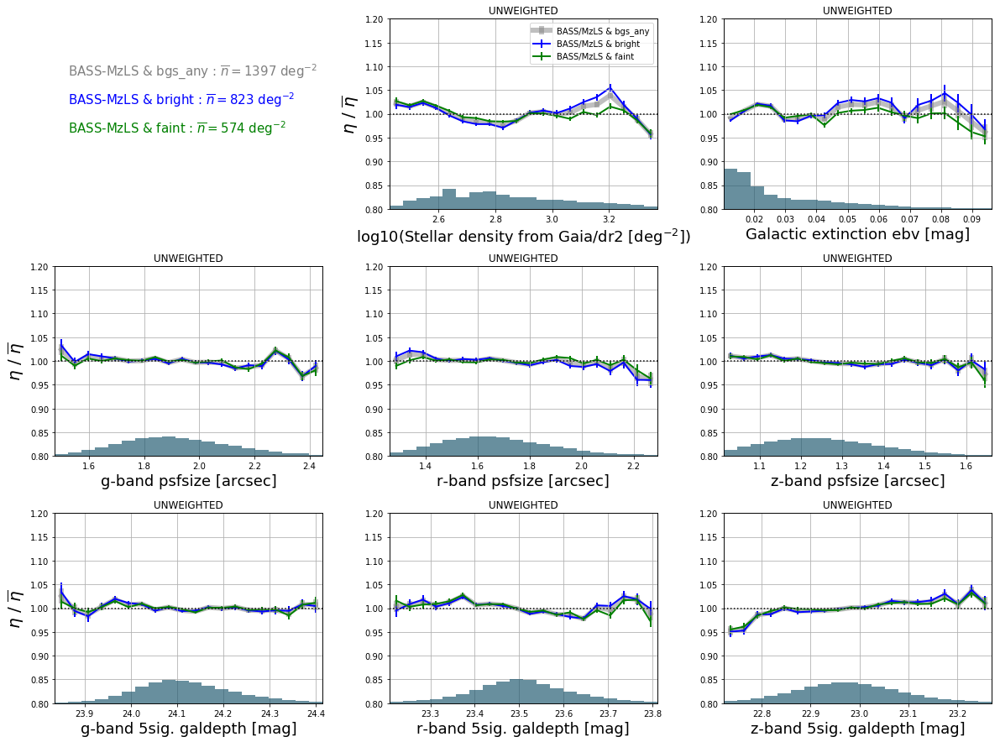

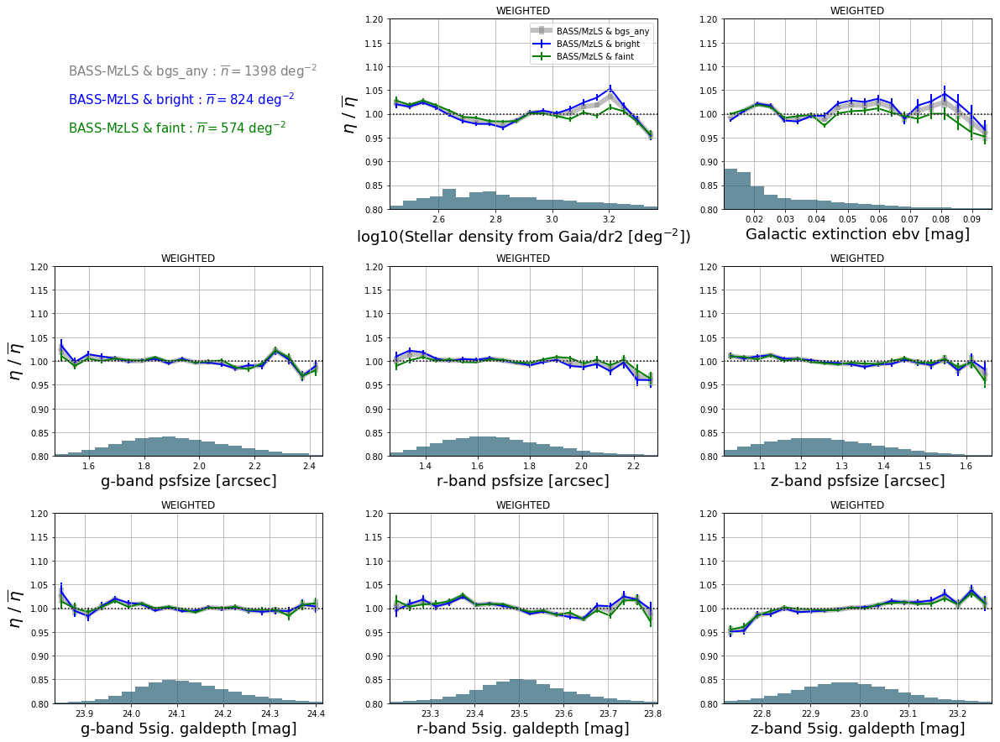

In [51]:
# dr8_south+north : density distributions + systematics

# settings
isdesi     = (hpdict['isdesi']) & (hpdict['bgsfracarea']>0) #this should be rename as "mainreg"
systs      = ['log10_stardens','ebv','psfsize_g', 'psfsize_r', 'psfsize_z','galdepth_g', 'galdepth_r', 'galdepth_z']
nx         = 20
cols       = ['0.5','b','g','r']    
#regs = [reg]
namesels=['bgs_any', 'bright', 'faint']
#

# looping on subselections
#for key, title in zip([None, ws], ['UNWEIGHTED', 'WEIGHTED']):
for key, title in zip([hpdict, hpdict_ws], ['UNWEIGHTED', 'WEIGHTED']):
    
    # systematics
    fig    = plt.figure(figsize=(20,15))
    gs     = gridspec.GridSpec(3,3,hspace=0.30,wspace=0.25)
        
    for i in range(len(systs)+1):
        
        if i == 0:
            axinfo = fig.add_subplot(gs[i])
            # infos
            axinfo.axis('off')
            #axinfo.text(0.5,0.9,namesel,fontsize=20,fontweight='bold',ha='center',transform=axinfo.transAxes)
            tmpy = 0.7
            #for regi,col in zip(regs,cols):
            #if reg == 'south':reg_ = 'DECaLS+DES'
            #else: reg_ = reg
            for namesel,col in zip(namesels,cols):
                tmpstr = surveylab+' & '+namesel+' : '+r'$\overline{n}=$'+'%.0f'%key['meandens_'+namesel+'_'+reg]+r' deg$^{-2}$'
                axinfo.text(0.05,tmpy,tmpstr,color=col,fontsize=15,transform=axinfo.transAxes)
                tmpy  -= 0.15
        else:
            syst = systs[i-1]
            if (i%3==0) or (i==1): ylab=True
            else: ylab = False
            if i == 1: label = True
            else: label = False
            #if title == 'UNWEIGHTED': 
            #    weights = False
            #    onlyweights=False
            #else: 
            #    weights = True
            #    onlyweights=True
                
            plot_sysdens(hpdicttmp=key, namesels=namesels, regs=[reg], syst=syst, mainreg=isdesi, xlim=None, n=i, nx=nx, clip=True, 
                         denslims=False, ylab=ylab, weights=False, fig=fig, gs=gs, label=label, title=title, 
                             ws=None)
    
    # save fig
    fig.savefig('%s/systematics_main_bgs_%s_%s.png' %(pathdir, survey, title), bbox_inches = 'tight', pad_inches = 0)
    print('')
    print('')

### Systematics with and withouth MS masking

In [28]:
bgs_MS = ((cat['BGSBITS'] & 2**(1)) != 0)
MS = ((cat['MASKBITS'] & 2**11)==0)
Ared = hpdict['bgsarea_'+reg]

namesels = {'bgs':bgs_any,
            'bgs & ~MS':((bgs_any) & (MS)), #BGS applying MS mask
            'bgs & ~MS & LG':((bgs_any) & (bgs_MS))} #BGS applying MS mask but without masking the large galaxies (except for LG around BS and GC)

for key, val in zip(namesels.keys(), namesels.values()):
    print('%s: \t %.2f (objects/sq.deg)' %(key, np.sum(val)/Ared))


bgs: 	 1393.85 (objects/sq.deg)
bgs & ~MS: 	 1374.42 (objects/sq.deg)
bgs & ~MS & LG: 	 1374.71 (objects/sq.deg)


In [29]:
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['MS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=cat_ex['b'], log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  68230483
bgsfracarea DONE...
regions DONE...
area_all = 4325 deg2
bgsarea_south = 0 deg2
bgsarea_decals = 0 deg2
bgsarea_des = 0 deg2
bgsarea_north = 4325 deg2
bgsarea_south_n = 0 deg2
bgsarea_south_s = 0 deg2
bgsarea_svfields = 193 deg2
bgsarea_svfields_n = 193 deg2
bgsarea_svfields_s = 0 deg2
bgsarea_svfields_fg = 92 deg2
bgsarea_svfields_fg_n = 92 deg2
bgsarea_svfields_fg_s = 0 deg2
bgsarea_svfields_ij = 53 deg2
bgsarea_svfields_ij_n = 53 deg2
bgsarea_svfields_ij_s = 0 deg2
areas DONE...
computing for  north / bgs
computing for  north / bgs & ~MS
computing for  north / bgs & ~MS & LG
target densities in north DONE...
computing for  south / bgs
computing for  south / bgs & ~MS
computing for  south / bgs & ~MS & LG
target densities in south DONE...
meandens_bgs_all = 1421 /deg2
meandens_bgs_south = nan /deg2
meandens_bgs_decals = nan /deg2
meandens_bgs_des = nan /deg2
meandens_bgs_north = 1421 /

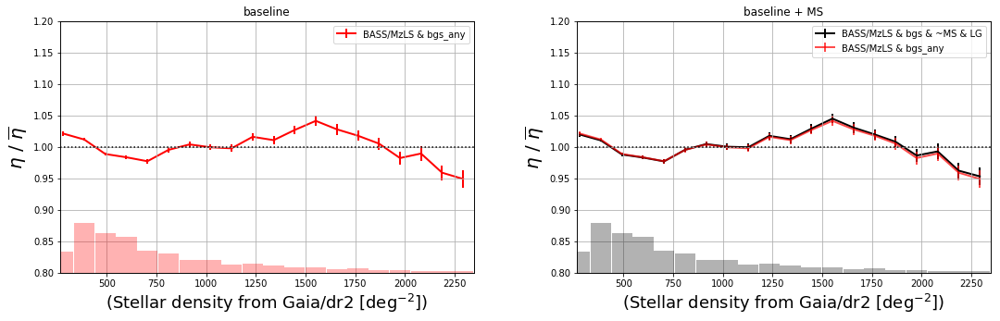

In [30]:
#
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict['isdesi']) & (hpdict['bgsfracarea']>0) #this should be rename as "mainreg"
nx         = 20
cols       = ['r','b','g','r']

x, y, yerr, lab = plot_sysdens(hpdicttmp=hpdict, namesels=['bgs_any'], regs=[reg_], syst='stardens', mainreg=isdesi, xlim=None, n=0, nx=nx, clip=True, 
                     denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='baseline', label=True, ws=None, cols=['r'], overbyreg=False, get_values=True)

ax = plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['bgs & ~MS & LG'], regs=[reg_], syst='stardens', mainreg=isdesi, xlim=None, n=1, nx=nx, clip=True, 
                     denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='baseline + MS', label=True, ws=None, cols=['k'], overbyreg=False)

ax.errorbar(x, y, yerr, color='r',ecolor='r',zorder=1,lw=2,alpha=0.7, label=lab)
ax.legend()


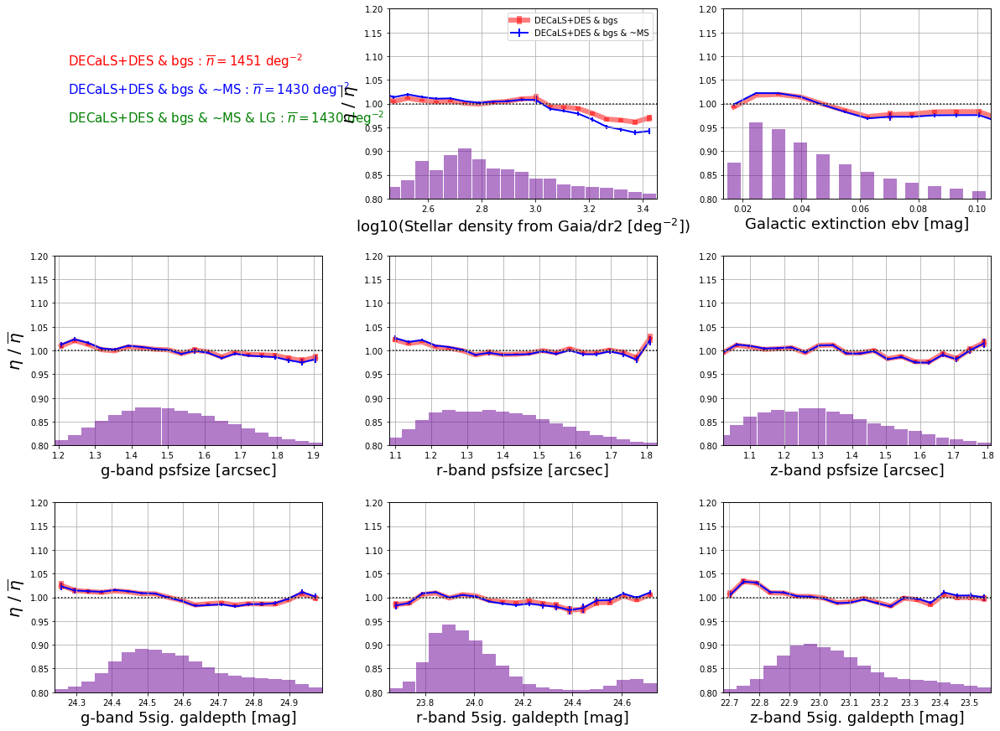

In [27]:
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0) #this should be rename as "mainreg"
systs      = ['log10_stardens','ebv','psfsize_g', 'psfsize_r', 'psfsize_z','galdepth_g', 'galdepth_r', 'galdepth_z']
nx         = 20
cols       = ['r','b','g','r']    
    
# systematics
fig    = plt.figure(figsize=(20,15))
gs     = gridspec.GridSpec(3,3,hspace=0.30,wspace=0.25)

for i in range(len(systs)+1):

    if i == 0:
        axinfo = fig.add_subplot(gs[i])
        # infos
        axinfo.axis('off')
        #axinfo.text(0.5,0.9,namesel,fontsize=20,fontweight='bold',ha='center',transform=axinfo.transAxes)
        tmpy = 0.7
        #for regi,col in zip(regs,cols):
        #if reg == 'south':reg_ = 'DECaLS+DES'
        #else: reg_ = reg
        for namesel,col in zip(namesels,cols):
            tmpstr = surveylab+' & '+namesel+' : '+r'$\overline{n}=$'+'%.0f'%hpdict_tmp['meandens_'+namesel+'_'+reg]+r' deg$^{-2}$'
            axinfo.text(0.05,tmpy,tmpstr,color=col,fontsize=15,transform=axinfo.transAxes)
            tmpy  -= 0.15
    else:
        syst = systs[i-1]
        if (i%3==0) or (i==1): ylab=True
        else: ylab = False
        if i == 1: label = True
        else: label = False
        #if title == 'UNWEIGHTED': 
        #    weights = False
        #    onlyweights=False
        #else: 
        #    weights = True
        #    onlyweights=True

        plot_sysdens(hpdicttmp=hpdict_tmp, namesels=list(namesels.keys())[:-1], regs=[reg], syst=syst, mainreg=isdesi, xlim=None, n=i, nx=nx, clip=True, 
                     denslims=False, ylab=ylab, weights=False, fig=fig, gs=gs, label=label, title=None, 
                         ws=None, cols=cols, overbyreg=False)

# save fig
fig.savefig('%s/systematics_MS_comparison_%s_%s.png' %(pathdir, survey, 'unweighted'), bbox_inches = 'tight', pad_inches = 0)

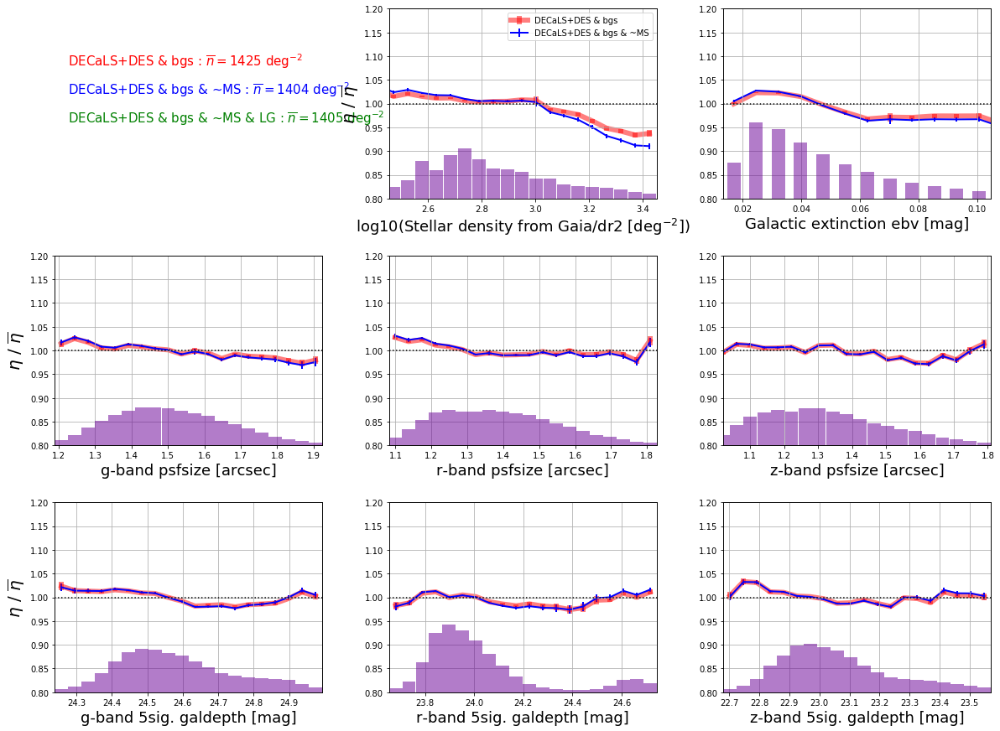

In [25]:
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0) #this should be rename as "mainreg"
systs      = ['log10_stardens','ebv','psfsize_g', 'psfsize_r', 'psfsize_z','galdepth_g', 'galdepth_r', 'galdepth_z']
nx         = 20
cols       = ['r','b','g','r']    
    
# systematics
fig    = plt.figure(figsize=(20,15))
gs     = gridspec.GridSpec(3,3,hspace=0.30,wspace=0.25)

for i in range(len(systs)+1):

    if i == 0:
        axinfo = fig.add_subplot(gs[i])
        # infos
        axinfo.axis('off')
        #axinfo.text(0.5,0.9,namesel,fontsize=20,fontweight='bold',ha='center',transform=axinfo.transAxes)
        tmpy = 0.7
        #for regi,col in zip(regs,cols):
        #if reg == 'south':reg_ = 'DECaLS+DES'
        #else: reg_ = reg
        for namesel,col in zip(namesels,cols):
            tmpstr = surveylab+' & '+namesel+' : '+r'$\overline{n}=$'+'%.0f'%hpdict_tmp['meandens_'+namesel+'_'+reg]+r' deg$^{-2}$'
            axinfo.text(0.05,tmpy,tmpstr,color=col,fontsize=15,transform=axinfo.transAxes)
            tmpy  -= 0.15
    else:
        syst = systs[i-1]
        if (i%3==0) or (i==1): ylab=True
        else: ylab = False
        if i == 1: label = True
        else: label = False
        #if title == 'UNWEIGHTED': 
        #    weights = False
        #    onlyweights=False
        #else: 
        #    weights = True
        #    onlyweights=True

        plot_sysdens(hpdicttmp=hpdict_tmp, namesels=list(namesels.keys())[:-1], regs=[reg], syst=syst, mainreg=isdesi, xlim=None, n=i, nx=nx, clip=True, 
                     denslims=False, ylab=ylab, weights=False, fig=fig, gs=gs, label=label, title=None, 
                         ws=None, cols=cols)

# save fig
fig.savefig('%s/systematics_MS_comparison_%s_%s.png' %(pathdir, survey, 'unweighted'), bbox_inches = 'tight', pad_inches = 0)

### Systematics separated by best model fitted

In [19]:
namesels = {}
for i in ['COMP', 'DEV ', 'EXP ', 'PSF ', 'REX ']:
    namesels[i] = (cat['TYPE'] == i) & (bgs_any)

In [20]:
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=cat_ex['b'], log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  145754705
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / COMP
computing for  north / DEV 
computing for  north / EXP 
computing for  north / PSF 
computing for  north / REX 
target densities in north DONE...
computing for  south / COMP
computing for  south / DEV 
computing for  south / EXP 
computing for  south / PSF 
computing for  south / REX 
target densities in south DONE...
meandens_COMP_all = 31 /deg2
meandens_COMP_des = 50 /deg2
meandens_COMP_decals = 28 /deg2
meandens_COMP_north = nan /deg2
meandens_COMP_south = 31 /deg2
meandens_COMP_svfields = 34 /deg2
meandens_COMP_svfields_n = nan /deg2
meandens_COMP_svfields_s = 34 /deg2
meandens_DEV _all = 630 /deg2
meandens_DEV _des = 650 /deg2
meandens_DEV _decals = 627 /deg2
meandens_DEV _north = nan /deg2
meandens_DEV _south = 630 /deg2
meandens_DEV _svfields = 655 /deg2
meandens_DEV _svfields_n = nan /deg2
meandens_DEV

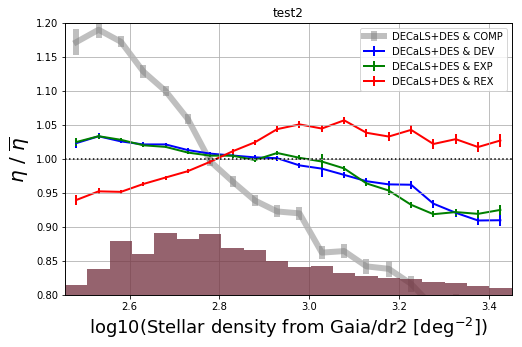

In [27]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['COMP', 'DEV ', 'EXP ', 'REX '], regs=[reg], 
                 syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=20, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test2', label=True)

### Systematics separated by rmag bins

In [30]:
namesels = {}
mags = np.linspace(16, 20, 9)
for i in range(len(mags[:-1])):
    namesels['%s_%s' %(str(mags[i]), str(mags[i+1]))] = (cat['RMAG'] > mags[i]) & (cat['RMAG'] < mags[i+1]) & (bgs_any)

In [31]:
namesels.keys()

dict_keys(['16.0_16.5', '16.5_17.0', '17.0_17.5', '17.5_18.0', '18.0_18.5', '18.5_19.0', '19.0_19.5', '19.5_20.0'])

In [32]:
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=cat_ex['b'], log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  145754705
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / 16.0_16.5
computing for  north / 16.5_17.0
computing for  north / 17.0_17.5
computing for  north / 17.5_18.0
computing for  north / 18.0_18.5
computing for  north / 18.5_19.0
computing for  north / 19.0_19.5
computing for  north / 19.5_20.0
target densities in north DONE...
computing for  south / 16.0_16.5
computing for  south / 16.5_17.0
computing for  south / 17.0_17.5
computing for  south / 17.5_18.0
computing for  south / 18.0_18.5
computing for  south / 18.5_19.0
computing for  south / 19.0_19.5
computing for  south / 19.5_20.0
target densities in south DONE...
meandens_16.0_16.5_all = 12 /deg2
meandens_16.0_16.5_des = 12 /deg2
meandens_16.0_16.5_decals = 12 /deg2
meandens_16.0_16.5_north = nan /deg2
meandens_16.0_16.5_south = 12 /deg2
meandens_16.0_16.5_svfields = 11 /deg2
meandens_16.0_16.5_svfields_n = nan 

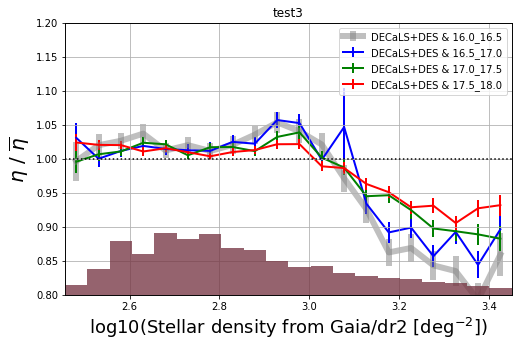

In [33]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['16.0_16.5', '16.5_17.0', '17.0_17.5', '17.5_18.0'], regs=[reg], 
                 syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=20, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test3', label=True)

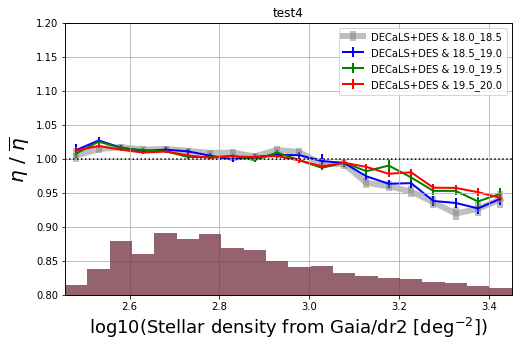

In [34]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['18.0_18.5', '18.5_19.0', '19.0_19.5', '19.5_20.0'], regs=[reg], 
                 syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=20, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test4', label=True)

# Skymap footprint
Below code only needs the randoms.

area_all: 	 20332.475(whole) 	 14265.679(desifootprint)
bgsarea_south: 	 15173.940(whole) 	 9716.980(desifootprint)
bgsarea_north: 	 5158.535(whole) 	 4548.699(desifootprint)
bgsarea_des: 	 5060.633(whole) 	 1113.520(desifootprint)
NGC DECaLS in DESI footprint: 	 5322.602
SGC DECaLS in DESI footprint: 	 4394.378


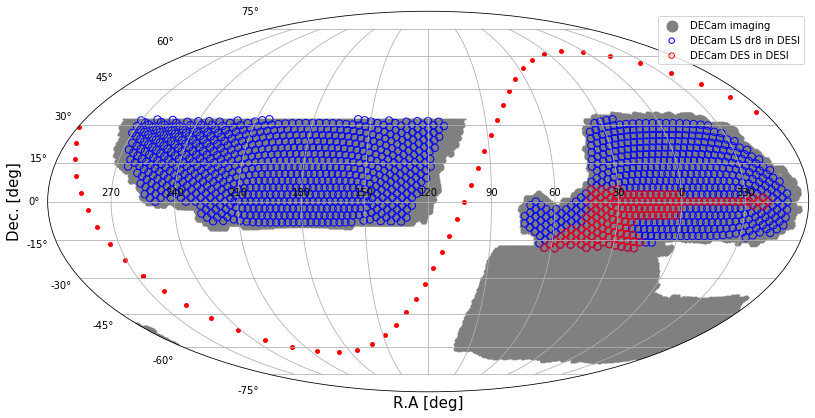

In [5]:
#
from QA import set_mwd, get_radec_mw
from io_ import get_isdes

# dict without geometrical mask and in WHOLE SWEEPS footprint
hpdict0 = get_dict(cat=None, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=None, 
                      maskrand=None, maskcat=None, Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                            desifootprint=False, namesels=None, target_outputs=False, log=False)
# dict without geometrical mask and in DESI footprint
hpdict1 = get_dict(cat=None, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=None, 
                      maskrand=None, maskcat=None, Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                            desifootprint=True, namesels=None, target_outputs=False, log=False)

#
for i in ['area_all', 'bgsarea_south', 'bgsarea_north', 'bgsarea_des']:
    print('%s: \t %.3f(whole) \t %.3f(desifootprint)' %(i, hpdict0[i], hpdict1[i]))
    
if survey == 'south':
    # DECaLS area in the NGC/SGC within DESI footprint
    area_decals_ngc = hpdict1['bgsfracarea'][(hpdict1['issouth']) & (hpdict1['galb'] > 0)].sum() * pixarea
    area_decals_sgc = hpdict1['bgsfracarea'][(hpdict1['issouth']) & (hpdict1['galb'] < 0)].sum() * pixarea
    print('NGC DECaLS in DESI footprint: \t %.3f' %(area_decals_ngc))
    print('SGC DECaLS in DESI footprint: \t %.3f' %(area_decals_sgc))
    
if survey == 'north':
    # DECaLS area in the NGC/SGC within DESI footprint
    area_bass_ngc = hpdict1['bgsfracarea'][(hpdict1['isnorth']) & (hpdict1['galb'] > 0)].sum() * pixarea
    print('NGC BASS/MzLS in DESI footprint: \t %.3f' %(area_bass_ngc))

desitiles = fitsio.read('/global/homes/q/qmxp55/desi-tiles-viewer.fits')
org          = 120  # centre ra for mollweide plots
projection   = 'mollweide'

# plotting bgsfracarea
fig = plt.figure(figsize=(14, 7))
gs = gridspec.GridSpec(1,1,wspace=0.15,hspace=0)

ax = plt.subplot(gs[0],projection=projection)
_ = set_mwd(ax,org=org)
ramw,decmw = get_radec_mw(hpdict0['ra'],hpdict0['dec'],org)
tmp        = (hpdict0['bgsfracarea']>0) & (hpdict0['is'+survey])
if survey == 'south':
    SC         = ax.scatter(ramw[tmp],decmw[tmp],s=0.4, color='gray', label=r'DECam imaging')
if survey == 'north':
    SC         = ax.scatter(ramw[tmp],decmw[tmp],s=0.4, color='gray', label=r'BASS/MzLS imaging')

ramw,decmw = get_radec_mw(desitiles['ra'],desitiles['dec'],org)
if survey == 'south':
    tmp = (desitiles['in_desi'] ==  1) & (desitiles['dec'] < dec_resol_ns)
    SC         = ax.scatter(ramw[tmp],decmw[tmp], marker='.', s = 220, facecolors='none', edgecolors='blue', label=r'DECam LS dr8 in DESI')
if survey == 'north':
    tmp = (desitiles['in_desi'] ==  1) & (desitiles['dec'] > dec_resol_ns)
    SC         = ax.scatter(ramw[tmp],decmw[tmp], marker='.', s = 220, facecolors='none', edgecolors='blue', label=r'BASS/MzLS dr8 in DESI')


if survey == 'south':
    desitilesindes = get_isdes(desitiles['ra'],desitiles['dec'])
    tmp = (desitiles['in_desi'] ==  1) & (desitiles['dec'] < dec_resol_ns) & (desitilesindes)
    SC         = ax.scatter(ramw[tmp],decmw[tmp], marker='.', s = 220, facecolors='none', edgecolors='red', label=r'DECam DES in DESI')

gc = SkyCoord(l=np.linspace(0, 360, 50)*units.degree, b=np.full(50, 0)*units.degree, frame='galactic')
ramw,decmw = get_radec_mw(gc.icrs.ra.value, gc.icrs.dec.value,org)
SC         = ax.scatter(ramw, decmw, color='r', marker='.', lw=2)

lgnd = ax.legend()
[handle.set_sizes([120.0]) for handle in lgnd.legendHandles]

fig.savefig('%s/skyplot_%s.png' %(pathdir, survey), bbox_inches = 'tight', pad_inches = 0)


## get area by number of passes + skymap of regions

In [7]:
# get the area covered by the number of passes from 1 to 3 and per band and for the joint bands.
Apasses = {}
for i in [0, 1, 2]:
    for j in ['G', 'R', 'Z', 'all']:
        
        if j == 'all': mask = (ran['NOBS_G'] > i) & (ran['NOBS_R'] > i) & (ran['NOBS_Z'] > i)
        else: mask = (ran['NOBS_'+j] > i)
            
        hpdicttest = get_dict(pixmapfile=dr8pix, hppix_ran=hppix_ran, maskrand=mask, Nranfiles=Nranfiles, 
                              ranindesi=ranindesi, desifootprint=True, target_outputs=False)
        
        for k in ['south', 'north', 'decals', 'des']:
            Apasses[j+str(i+1)+'_'+k] = hpdicttest['bgsarea_'+k]
        Apasses[j+str(i+1)+'_'+'all'] = hpdicttest['area_all']
            
        print('%s >= %i: \t south: %2.3g, north: %2.3g, decals: %2.3g, des: %2.3g, all: %2.3g' 
              %(j, i+1, hpdicttest['bgsarea_south'], hpdicttest['bgsarea_north'], hpdicttest['bgsarea_decals'], 
                    hpdicttest['bgsarea_des'], hpdicttest['area_all']))

G >= 1: 	 south: 9.69e+03, north: 4.54e+03, decals: 8.57e+03, des: 1.11e+03, all: 1.42e+04
R >= 1: 	 south: 9.69e+03, north: 4.54e+03, decals: 8.57e+03, des: 1.11e+03, all: 1.42e+04
Z >= 1: 	 south: 9.69e+03, north: 4.54e+03, decals: 8.57e+03, des: 1.11e+03, all: 1.42e+04
all >= 1: 	 south: 9.67e+03, north: 4.52e+03, decals: 8.56e+03, des: 1.11e+03, all: 1.42e+04
G >= 2: 	 south: 9.45e+03, north: 4.49e+03, decals: 8.34e+03, des: 1.11e+03, all: 1.39e+04
R >= 2: 	 south: 9.42e+03, north: 4.49e+03, decals: 8.31e+03, des: 1.11e+03, all: 1.39e+04
Z >= 2: 	 south: 9.49e+03, north: 4.49e+03, decals: 8.37e+03, des: 1.11e+03, all: 1.4e+04
all >= 2: 	 south: 9.26e+03, north: 4.41e+03, decals: 8.15e+03, des: 1.11e+03, all: 1.37e+04
G >= 3: 	 south: 7.77e+03, north: 3.93e+03, decals: 6.66e+03, des: 1.11e+03, all: 1.17e+04
R >= 3: 	 south: 7.57e+03, north: 3.9e+03, decals: 6.46e+03, des: 1.11e+03, all: 1.15e+04
Z >= 3: 	 south: 8.04e+03, north: 3.89e+03, decals: 6.93e+03, des: 1.11e+03, all: 1.19e+

In [8]:
#
print('BAND \t >= 1 \t\t >= 2 \t\t >= 3')
print('------------------------------------------')
for band in ['G', 'R', 'Z', 'all']:
    lab1 = band+'1'+'_south'
    lab2 = band+'2'+'_south'
    lab3 = band+'3'+'_south'
    
    print('%s: \t %.0f \t %.0f \t %.0f' %(band, Apasses[lab1], Apasses[lab2], Apasses[lab3]))


BAND 	 >= 1 		 >= 2 		 >= 3
------------------------------------------
G: 	 9687 	 9454 	 7769
R: 	 9686 	 9422 	 7569
Z: 	 9686 	 9487 	 8036
all: 	 9669 	 9257 	 6870


# DEV ZONE

In [68]:
#bgslist = ['BS', 'LG', 'GC', 'nobs', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF', 'QC_IVAR']
bgsbut20 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM','QC_FI','QC_FF','QC_IVAR', 'FMC2', 'CC', 'nobs', 'BS', 'LG', 'GC'], bgsmask=bgsmask(), rlimit=20)
bgsbut201 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM','QC_FI','QC_FF','QC_IVAR', 'FMC2', 'CC', 'nobs', 'BS', 'LG', 'GC'], bgsmask=bgsmask(), rlimit=20.1)
bgsbut205 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM','QC_FI','QC_FF','QC_IVAR', 'FMC2', 'CC', 'nobs', 'BS', 'LG', 'GC'], bgsmask=bgsmask(), rlimit=20.5)
bgsbut207 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['QC_FM','QC_FI','QC_FF','QC_IVAR', 'FMC2', 'CC', 'nobs', 'BS', 'LG', 'GC'], bgsmask=bgsmask(), rlimit=20.7)
#bgsbutCC = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['CC'], bgsmask=bgsmask())
#bgsbutFMC2 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['FMC2'], bgsmask=bgsmask())
#bgsbutBSLG = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=['BS', 'LG'], bgsmask=bgsmask())

In [43]:
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)

In [69]:
namesels = {}
#namesels['bgs_any'] = bgs_any
namesels['bgsbut20'] = bgsbut20
namesels['bgsbut201'] = bgsbut201
namesels['bgsbut205'] = bgsbut205
namesels['bgsbut207'] = bgsbut207

In [70]:
#dic with default BGS selection and in DESI footprint
#maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs']))
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=None,
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=galb, log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  145754705
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / bgsbut20
computing for  north / bgsbut201
computing for  north / bgsbut205
computing for  north / bgsbut207
target densities in north DONE...
computing for  south / bgsbut20
computing for  south / bgsbut201
computing for  south / bgsbut205
computing for  south / bgsbut207
target densities in south DONE...
meandens_bgsbut20_all = 1452 /deg2
meandens_bgsbut20_des = 1442 /deg2
meandens_bgsbut20_decals = 1453 /deg2
meandens_bgsbut20_north = nan /deg2
meandens_bgsbut20_south = 1452 /deg2
meandens_bgsbut20_svfields = 1466 /deg2
meandens_bgsbut20_svfields_n = nan /deg2
meandens_bgsbut20_svfields_s = 1466 /deg2
meandens_bgsbut201_all = 1608 /deg2
meandens_bgsbut201_des = 1596 /deg2
meandens_bgsbut201_decals = 1610 /deg2
meandens_bgsbut201_north = nan /deg2
meandens_bgsbut201_south = 1608 /deg2
meandens_bgsbut201_svfields =

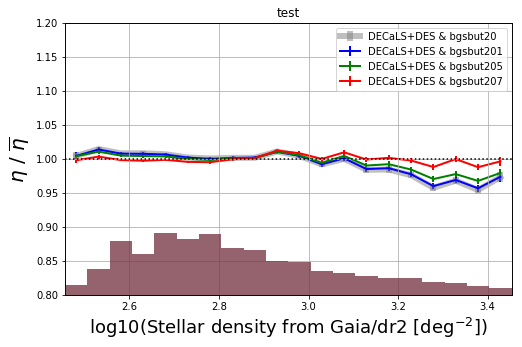

In [71]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['bgsbut20', 'bgsbut201', 'bgsbut205', 'bgsbut207'], regs=[reg], 
                 syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=20, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True)

#plot_sysdens(hpdicttmp=hpdict_tmp, namesels=[ 'bgs_19.0_19.5', 'bgs_19.5_20.0'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=1, nx=nx, clip=True, 
#                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True)


In [73]:
#bgslist = ['BS', 'LG', 'GC', 'nobs', 'FMC2', 'CC', 'QC_FM', 'QC_FI', 'QC_FF', 'QC_IVAR']
bgsbut20 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=None, bgsmask=bgsmask(), rlimit=20)
bgsbut201 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=None, bgsmask=bgsmask(), rlimit=20.1)
bgsbut205 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=None, bgsmask=bgsmask(), rlimit=20.5)
bgsbut207 = bgsbut(bgsbits=cat['BGSBITS'], rmag=cat['RMAG'], pop=None, bgsmask=bgsmask(), rlimit=20.7)

In [74]:
namesels = {}
namesels['bgsbut20'] = bgsbut20
namesels['bgsbut201'] = bgsbut201
namesels['bgsbut205'] = bgsbut205
namesels['bgsbut207'] = bgsbut207

In [75]:
#dic with default BGS selection and in DESI footprint
#maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs']))
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=galb, log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  145754705
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / bgsbut20
computing for  north / bgsbut201
computing for  north / bgsbut205
computing for  north / bgsbut207
target densities in north DONE...
computing for  south / bgsbut20
computing for  south / bgsbut201
computing for  south / bgsbut205
computing for  south / bgsbut207
target densities in south DONE...
meandens_bgsbut20_all = 1426 /deg2
meandens_bgsbut20_des = 1430 /deg2
meandens_bgsbut20_decals = 1425 /deg2
meandens_bgsbut20_north = nan /deg2
meandens_bgsbut20_south = 1426 /deg2
meandens_bgsbut20_svfields = 1437 /deg2
meandens_bgsbut20_svfields_n = nan /deg2
meandens_bgsbut20_svfields_s = 1437 /deg2
meandens_bgsbut201_all = 1578 /deg2
meandens_bgsbut201_des = 1583 /deg2
meandens_bgsbut201_decals = 1578 /deg2
meandens_bgsbut201_north = nan /deg2
meandens_bgsbut201_south = 1578 /deg2
meandens_bgsbut201_svfields =

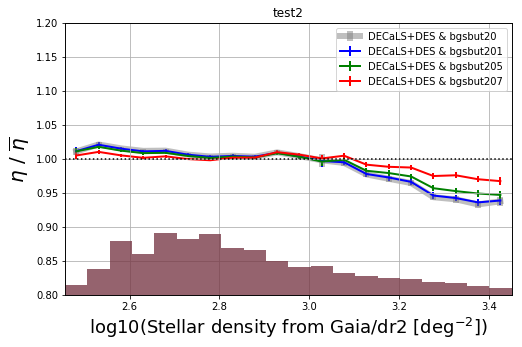

In [76]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)
isdesi     = (hpdict_tmp['isdesi']) & (hpdict_tmp['bgsfracarea']>0)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['bgsbut20', 'bgsbut201', 'bgsbut205', 'bgsbut207'], regs=[reg], 
                 syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=20, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test2', label=True)

#plot_sysdens(hpdicttmp=hpdict_tmp, namesels=[ 'bgs_19.0_19.5', 'bgs_19.5_20.0'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=1, nx=nx, clip=True, 
#                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True)


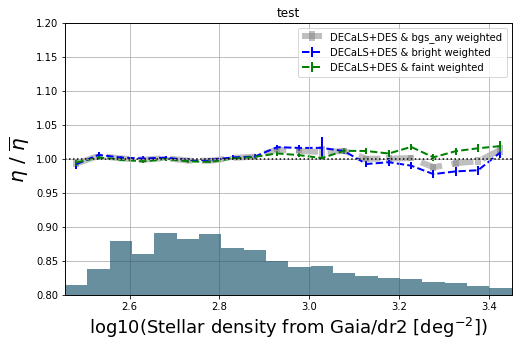

In [80]:
#
ws = 1./((-3.96*10**(-5))*hpdict['stardens'] + 1.03)

fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)

plot_sysdens(hpdicttmp=hpdict, namesels=['bgs_any', 'bright', 'faint'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=nx, clip=True, 
                         denslims=False, ylab=True, weights=True, fig=fig, gs=gs, title='test', label=True, ws=ws, onlyweights=True)

In [88]:
hpdict['meandens_bgs_any_south']

1425.646415390457

In [89]:
hpdict_tmp['meandens_bgs_any_south']

1432.660001909052

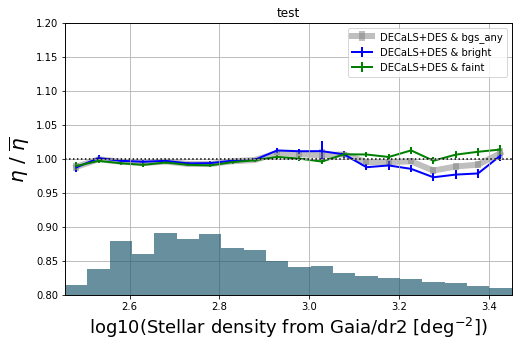

In [90]:
#
#ws = 1./((-3.96*10**(-5))*hpdict['stardens'] + 1.03)

fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['bgs_any', 'bright', 'faint'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=nx, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True, ws=None, onlyweights=False)

In [53]:
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)
namesels = {}
mags = [15, 18, 18.5, 19.0, 19.5, 20.0]
for num,i in enumerate(mags[:-1]):
    namesels['bgs_%s_%s' %(str(mags[num]), str(mags[num+1]))] = (bgs_any) & (cat['RMAG'] > mags[num]) & (cat['RMAG'] < mags[num+1])
    

In [55]:
#dic with default BGS selection and in DESI footprint
hpdict_tmp = get_dict(cat=cat, pixmapfile=dr8pix, hppix_ran=hppix_ran, hppix_cat=hppix_cat, 
                      maskrand=((rancuts['BS']) & (rancuts['GC']) & (rancuts['LG']) & (rancuts['nobs'])),
                          maskcat=None, 
                             Nranfiles=Nranfiles, ranindesi=ranindesi, catindesi=None, 
                                desifootprint=True, namesels=namesels, galb=galb, log=True, survey='custom')

positions and desifotprint DONE...
systematics DONE...
randdens =  15000  ; len randoms =  145754705
bgsfracarea DONE...
regions DONE...
areas DONE...
computing for  north / bgs_15_18
computing for  north / bgs_18_18.5
computing for  north / bgs_18.5_18.5
computing for  north / bgs_18.5_19.0
computing for  north / bgs_19.0_19.5
computing for  north / bgs_19.5_20.0
target densities in north DONE...
computing for  south / bgs_15_18
computing for  south / bgs_18_18.5
computing for  south / bgs_18.5_18.5
computing for  south / bgs_18.5_19.0
computing for  south / bgs_19.0_19.5
computing for  south / bgs_19.5_20.0
target densities in south DONE...
meandens_bgs_15_18_all = 154 /deg2
meandens_bgs_15_18_des = 153 /deg2
meandens_bgs_15_18_decals = 154 /deg2
meandens_bgs_15_18_north = nan /deg2
meandens_bgs_15_18_south = 154 /deg2
meandens_bgs_15_18_svfields = 151 /deg2
meandens_bgs_15_18_svfields_n = nan /deg2
meandens_bgs_15_18_svfields_s = 151 /deg2
meandens_bgs_18_18.5_all = 124 /deg2
meande

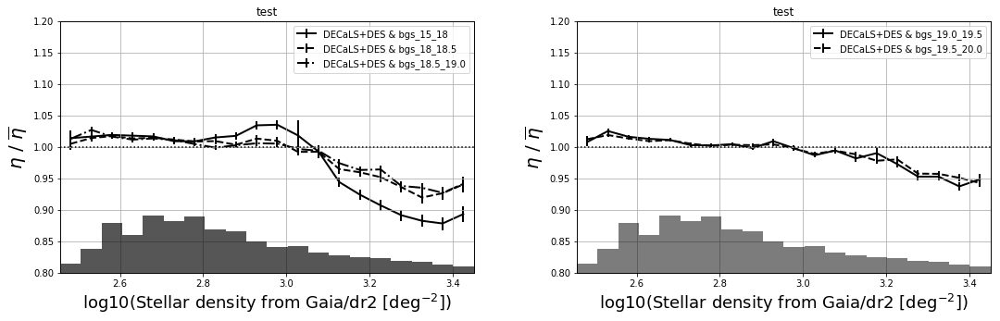

In [60]:
fig    = plt.figure(figsize=(18,5))
gs     = gridspec.GridSpec(1,2,hspace=0.30,wspace=0.25)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=['bgs_15_18', 'bgs_18_18.5', 'bgs_18.5_19.0'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=0, nx=nx, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True)

plot_sysdens(hpdicttmp=hpdict_tmp, namesels=[ 'bgs_19.0_19.5', 'bgs_19.5_20.0'], regs=[reg], syst='log10_stardens', mainreg=isdesi, xlim=None, n=1, nx=nx, clip=True, 
                         denslims=False, ylab=True, weights=False, fig=fig, gs=gs, title='test', label=True)


In [ ]:
bgs_bright = ((cat['BGSBITS'] & 2**(21)) != 0)
bgs_faint = ((cat['BGSBITS'] & 2**(22)) != 0)
bgs_any = ((cat['BGSBITS'] & 2**(20)) != 0)